## Setup

In [1]:
import pyspark
from pyspark.sql import SparkSession, Row
import pyspark.sql.functions as F
import pyspark.sql.types as T

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as tck
import statistics as stats
%matplotlib inline

In [3]:
spark = SparkSession.builder.appName("WeatherData_Analysis").getOrCreate()

In [4]:
spark

## Load Data

In [5]:
#define schema
schema = T.StructType([
    T.StructField("Date",T.DateType()),
    T.StructField("MinTemperature",T.DoubleType()),
    T.StructField("MaxTemperature",T.DoubleType()),
    T.StructField("Precipitation",T.DoubleType()),
    T.StructField("RelativeHumidity",T.DoubleType()),
    T.StructField("State",T.StringType()),
    T.StructField("District",T.StringType()),
])

In [6]:
#load data
weatherData = spark.read.load("Datasets/Output/WeatherDistrictData.csv",
                              format="csv",schema=schema,
                              header=True)

In [7]:
#check schema
weatherData.printSchema()

root
 |-- Date: date (nullable = true)
 |-- MinTemperature: double (nullable = true)
 |-- MaxTemperature: double (nullable = true)
 |-- Precipitation: double (nullable = true)
 |-- RelativeHumidity: double (nullable = true)
 |-- State: string (nullable = true)
 |-- District: string (nullable = true)



In [8]:
#adding additional columns
#  Month: for aggregating at month level
#  District_State : for agregating at district level
weatherData = (weatherData
               .withColumn("Month",F.concat_ws("-",F.year("Date"),
                    F.when(F.month("Date").between(1,9),F.concat(F.lit("0"),F.month("Date")))
                               .otherwise(F.month("Date"))))
               .withColumn("District_State", F.concat_ws(", ","District","State"))
              )

In [9]:
#Check Schema
weatherData.printSchema()

root
 |-- Date: date (nullable = true)
 |-- MinTemperature: double (nullable = true)
 |-- MaxTemperature: double (nullable = true)
 |-- Precipitation: double (nullable = true)
 |-- RelativeHumidity: double (nullable = true)
 |-- State: string (nullable = true)
 |-- District: string (nullable = true)
 |-- Month: string (nullable = false)
 |-- District_State: string (nullable = false)



In [10]:
#persist
weatherData.persist()

DataFrame[Date: date, MinTemperature: double, MaxTemperature: double, Precipitation: double, RelativeHumidity: double, State: string, District: string, Month: string, District_State: string]

In [11]:
weatherData.rdd.getNumPartitions()

3344

In [12]:
#Check Plan
weatherData.explain()

== Physical Plan ==
InMemoryTableScan [Date#0, MinTemperature#1, MaxTemperature#2, Precipitation#3, RelativeHumidity#4, State#5, District#6, Month#14, District_State#23]
   +- InMemoryRelation [Date#0, MinTemperature#1, MaxTemperature#2, Precipitation#3, RelativeHumidity#4, State#5, District#6, Month#14, District_State#23], StorageLevel(disk, memory, 1 replicas)
         +- *(1) Project [Date#0, MinTemperature#1, MaxTemperature#2, Precipitation#3, RelativeHumidity#4, State#5, District#6, concat_ws(-, cast(year(Date#0) as string), CASE WHEN ((month(Date#0) >= 1) AND (month(Date#0) <= 9)) THEN concat(0, cast(month(Date#0) as string)) ELSE cast(month(Date#0) as string) END) AS Month#14, concat_ws(, , District#6, State#5) AS District_State#23]
            +- FileScan csv [Date#0,MinTemperature#1,MaxTemperature#2,Precipitation#3,RelativeHumidity#4,State#5,District#6] Batched: false, DataFilters: [], Format: CSV, Location: InMemoryFileIndex[file:/home/bigdatauser07/Assignment/Datasets/Output

In [13]:
#check number of rows
#we have data for 2000-2013 i.e. 5114 days
#                 and 535 districts
#We should have 2735990 rows
weatherData.count()

2735990

In [14]:
#check data
weatherData.show()

+----------+-------------------+------------------+------------------+-------------------+----------------+---------------+-------+--------------------+
|      Date|     MinTemperature|    MaxTemperature|     Precipitation|   RelativeHumidity|           State|       District|  Month|      District_State|
+----------+-------------------+------------------+------------------+-------------------+----------------+---------------+-------+--------------------+
|2000-10-01|  4.285999999999995|17.400499999999994|               0.0|  0.380219571507693|HIMACHAL PRADESH|LAHUL AND SPITI|2000-10|LAHUL AND SPITI, ...|
|2001-02-28| -8.129000000000001| 4.131999999999994|               0.0| 0.4219996507884905|HIMACHAL PRADESH|LAHUL AND SPITI|2001-02|LAHUL AND SPITI, ...|
|2001-03-14| -4.487499999999995| 7.379000000000005|       0.954007812|  0.632047555971716|HIMACHAL PRADESH|LAHUL AND SPITI|2001-03|LAHUL AND SPITI, ...|
|2001-04-13| 1.4795000000000003|10.589500000000005| 4.782486617999999|  0.58624364

### Generate list of States

In [15]:
states = list(sorted([row["State"] for row in weatherData.select("State").distinct().collect()]))

## Plotting

In [16]:
def genBarPlot(df,state,column):
    plt.figure(figsize=(30,12))
    plt.bar(df.Month,df[column], align='edge', width=0.4)
    plt.xlabel("Time",size=16)
    plt.ylabel(column,size=16)
    plt.xticks(ticks=np.arange(0,5113,3),rotation=90,size=16)
    plt.yticks(size=16)
    plt.xlim([0,len(df.Month)])
    plt.title(state+" Monthly "+column,size=20)
    plt.show()

In [17]:
def genDualLinePlot(df,state,column1,column2,yaxis="",color1="red",color2="blue"):
    plt.figure(figsize=(30,12))
    plt.plot(df.Month,df[column1],color=color1,label=column1)
    plt.plot(df.Month,df[column2],color=color2,label=column2)
    plt.xlabel("Time",size=16)
    plt.ylabel(yaxis,size=16)
    plt.xticks(ticks=np.arange(0,5113,3),rotation=90,size=16)
    plt.yticks(size=16)
    plt.xlim([0,len(df.Month)])
    plt.title(state+" Monthly "+column1+" and "+column2,size=20)
    plt.show()

In [18]:
def genPlots(dataframe,state=None):
    if state:
        df = dataframe.filter(F.col("State")==state).toPandas().sort_values("Month")
    else:
        df = dataframe.toPandas().sort_values("Month")
        state = "India"
    print("Weather  Information for "+state)
    print(df.describe())
    genBarPlot(df,state,"TotalPrecipitation")    
    genBarPlot(df,state,"AverageRelativeHumidity")
    genDualLinePlot(df,state,"AverageMaxTemperature","AverageMinTemperature",yaxis="Temperature")
    

# Aggregate for India

In [19]:
#CReate GroupedDataFrame
monthlyDF = weatherData.groupBy("Month")

In [20]:
#Create Aggregations and Rename Columns
monthlyDF = (monthlyDF.agg(F.sum("Precipitation"),F.mean("MinTemperature"),F.mean("MaxTemperature"),F.mean("RelativeHumidity"))
                     .select("Month",
                            F.col("sum(Precipitation)").alias("TotalPrecipitation"),
                            F.col("avg(MinTemperature)").alias("AverageMinTemperature"),
                            F.col("avg(MaxTemperature)").alias("AverageMaxTemperature"),
                            F.col("avg(RelativeHumidity)").alias("AverageRelativeHumidity"))
                     )

Weather  Information for India
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean         80466.029589              19.500201              31.799056   
std          74711.658492               5.278116               4.156538   
min           4767.746250              10.266826              23.912973   
25%          18212.766053              14.557236              28.766255   
50%          49052.591049              20.787870              31.460115   
75%         129262.937160              24.313778              34.624450   
max         301653.784189              26.717995              39.768355   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.565278  
std                   0.138114  
min                   0.338025  
25%                   0.447709  
50%                   0.544456  
75%                   0.674061  
max                   0.85043

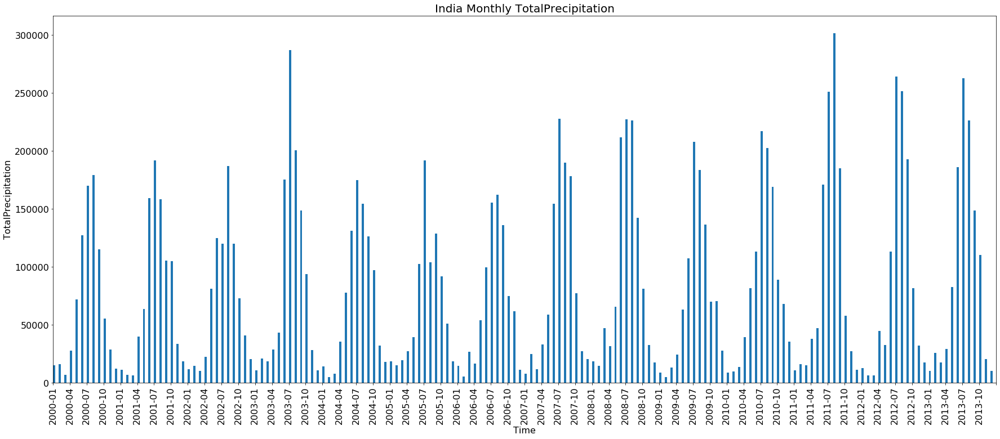

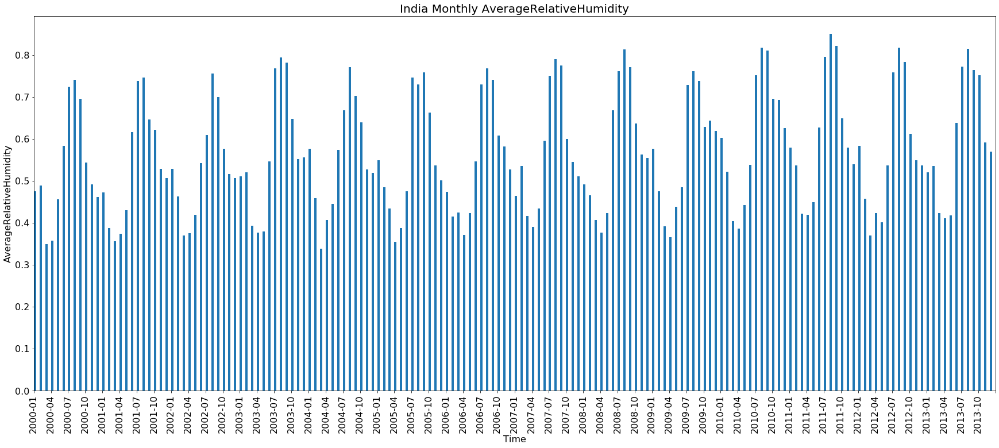

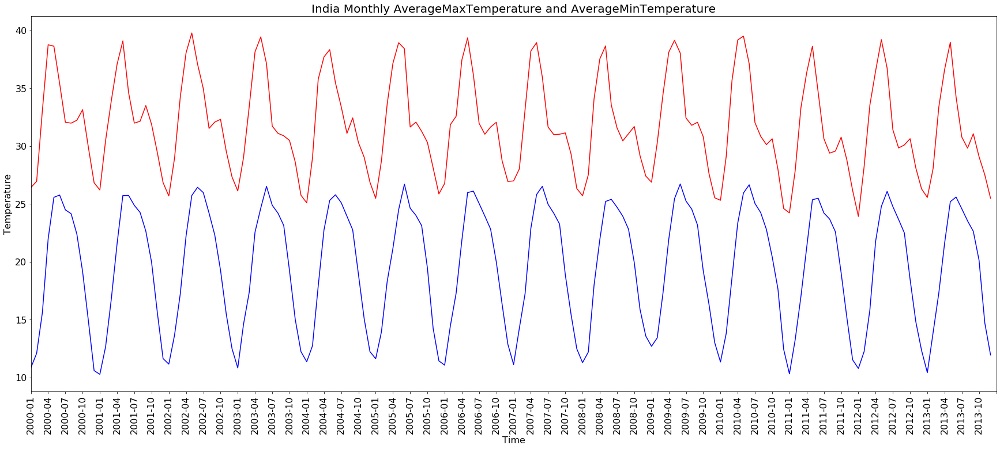

In [21]:
#Generate Plots
genPlots(monthlyDF)

#### Findings:

1. Precipitation:
   - The Total Preciptation recieved by India peaks in the months June-September. This is the result of the monsoon.
   - The year 2002 recieved comparatively less rainfall during the monsoon period than its preceding years, with the exception of August.
   - The year 2003 saw exceptionally high amount of precipitation during the monsoon, with July having a recond rainfall of over 275000 mm (averaging to over 500 mm in 535 districts).
   - The year 2005 again saw comparatively less rainfall, with the exception of July which remained close to the normal expectation.
   - There is a slight increase in total precipitation from 2007 onwards during the monsoon period.
   - The years 2011-2013 saw a slight increase over the normal observations for 2007-2010.
   
   
2. Relative Humidity:
   - India observes a fairly high mean relative humidity, with most months having mean relative humidity 0.4 to 0.8. 
   - The months of Feburary, March and April are exception to this with values ranging between 0.3 to 0.5.
   - The Mean Relative Humidy peaks during the monsoon season in which it ranges between 0.6 to 0.8.
   - There also appears to be a upward trend in the mean humidity value over the years.
   
   
3. Temperatures:
   - India records a wairly wide gap in mean minimum and maximum temperatures with a approximate difference of 15 Celcius.
   - The national average for minimum temperature ranges between 10-15ºC during the winter months(October to  late Feburary), and 20-27ºC during the summer months(May to late August).
   - The national average for maximum temperature ranges between 27-30ºC during the winter months(October to  late Feburary) post which there is a sudden increse in maximum temperature with early April recording temperatures above 35ºC. 
   - The maximum temperature then ranges between 35-40ºC until the monsoon sets in during which the temperatures go down to approx. 32ºC. There is a second peak in maximum temperature in late September to early October at the end of monsoon.
   - While the annual trend for mean minimum temperature remains close to normal with smooth corves, the mean maximum temperature records a more irregular behaviour in later years with more pointed turns and sharp peaks.

# Aggregating data for each State

Aggregated at Month Level

In [22]:
#Create GroupedDataFrame
monthlyStateDF = weatherData.groupBy(F.col("State"),F.col("Month"))

Aggregations used:
 - Precipitation    : sum  : To get total precipitation(rainfall) recieved by the state
 - MinTemperature   : mean : To get average minimum temperature for the state
 - MaxTemperature   : mean : To get average maximum temperature for the state
 - RelativeHumidity : mean : To get average relative humidity for the state

In [23]:
#Apply Aggregations and rename columns
monthlyStateDF = (monthlyStateDF.agg(F.sum("Precipitation"),F.mean("MinTemperature"),F.mean("MaxTemperature"),F.mean("RelativeHumidity"))
                     .select("State","Month",
                            F.col("sum(Precipitation)").alias("TotalPrecipitation"),
                            F.col("avg(MinTemperature)").alias("AverageMinTemperature"),
                            F.col("avg(MaxTemperature)").alias("AverageMaxTemperature"),
                            F.col("avg(RelativeHumidity)").alias("AverageRelativeHumidity"))
                     )

In [24]:
#Check Schema
monthlyStateDF.printSchema()

root
 |-- State: string (nullable = true)
 |-- Month: string (nullable = false)
 |-- TotalPrecipitation: double (nullable = true)
 |-- AverageMinTemperature: double (nullable = true)
 |-- AverageMaxTemperature: double (nullable = true)
 |-- AverageRelativeHumidity: double (nullable = true)



In [25]:
#check Execution Plan
monthlyStateDF.persist()
monthlyStateDF.explain()

== Physical Plan ==
InMemoryTableScan [State#5, Month#14, TotalPrecipitation#880, AverageMinTemperature#881, AverageMaxTemperature#882, AverageRelativeHumidity#883]
   +- InMemoryRelation [State#5, Month#14, TotalPrecipitation#880, AverageMinTemperature#881, AverageMaxTemperature#882, AverageRelativeHumidity#883], StorageLevel(disk, memory, 1 replicas)
         +- *(2) HashAggregate(keys=[State#5, Month#14], functions=[sum(Precipitation#3), avg(MinTemperature#1), avg(MaxTemperature#2), avg(RelativeHumidity#4)])
            +- Exchange hashpartitioning(State#5, Month#14, 200), true, [id=#95]
               +- *(1) HashAggregate(keys=[State#5, Month#14], functions=[partial_sum(Precipitation#3), partial_avg(MinTemperature#1), partial_avg(MaxTemperature#2), partial_avg(RelativeHumidity#4)])
                  +- InMemoryTableScan [MinTemperature#1, MaxTemperature#2, Precipitation#3, RelativeHumidity#4, State#5, Month#14]
                        +- InMemoryRelation [Date#0, MinTemperature#1,

Weather  Information for ANDAMAN AND NICOBAR ISLANDS
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           162.815159              27.717859              29.062963   
std            128.553752               0.988388               1.329648   
min              1.195990              25.564129              26.310484   
25%             65.922131              26.977589              28.021691   
50%            119.837117              27.850597              29.331755   
75%            238.236319              28.421003              30.073533   
max            634.413162              29.699613              31.412129   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.755490  
std                   0.017335  
min                   0.707739  
25%                   0.744332  
50%                   0.756004  
75%                   0.768688  
max    

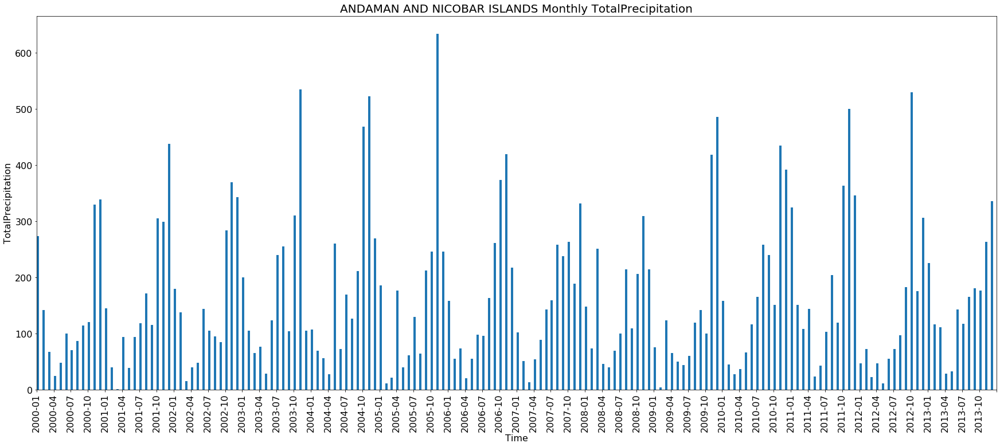

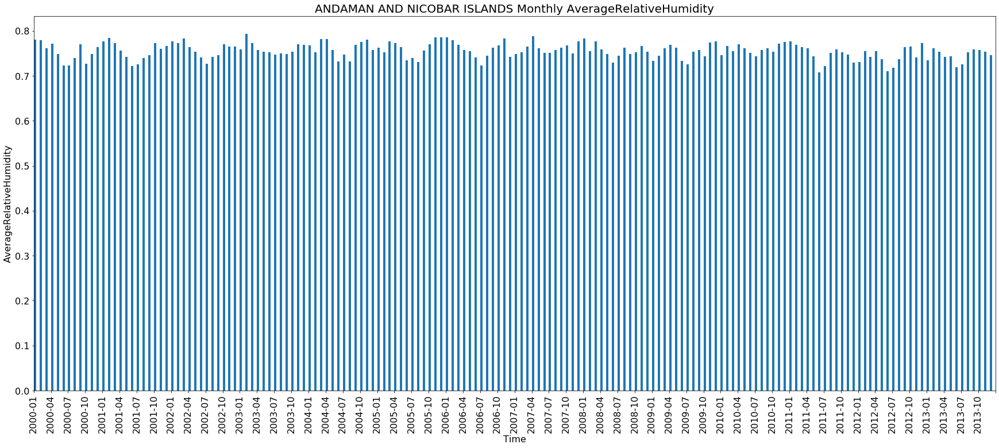

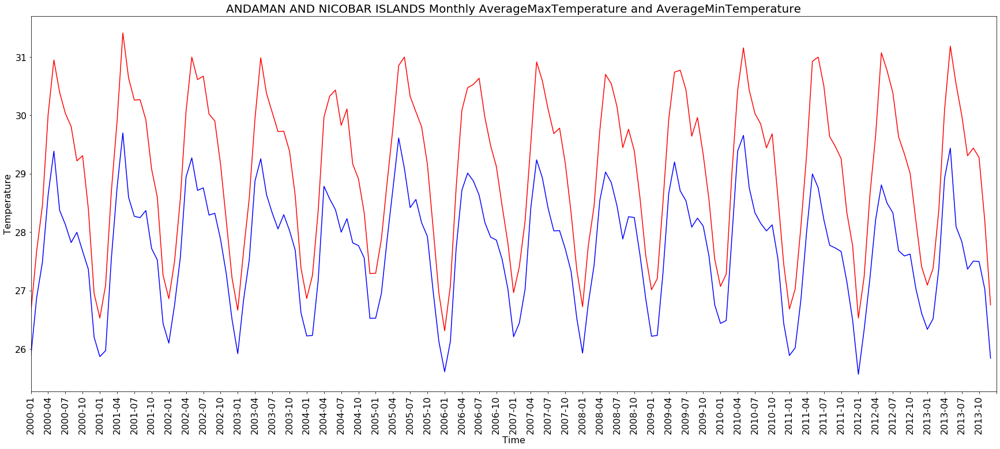

Weather  Information for ANDHRA PRADESH
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1504.478325              21.874083              33.902720   
std           1471.301210               3.972185               3.908372   
min              0.151859              13.998339              27.354694   
25%            173.743381              18.255322              30.886297   
50%            921.280968              22.771942              32.867654   
75%           2615.364009              24.867276              37.064494   
max           5822.693759              28.347342              42.618041   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.624926  
std                   0.106272  
min                   0.399048  
25%                   0.527084  
50%                   0.648468  
75%                   0.699135  
max                 

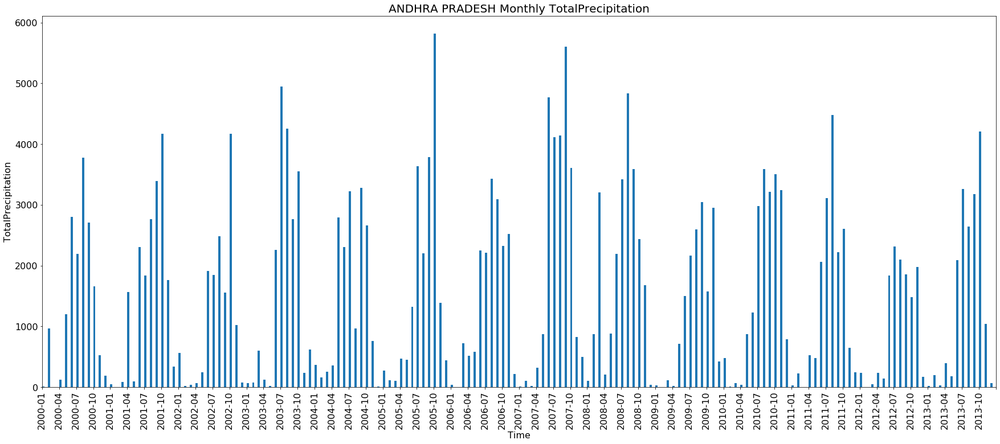

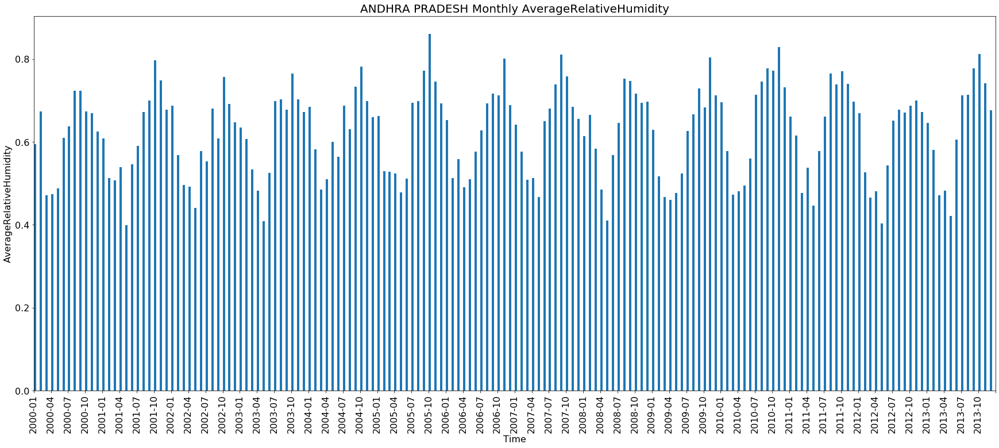

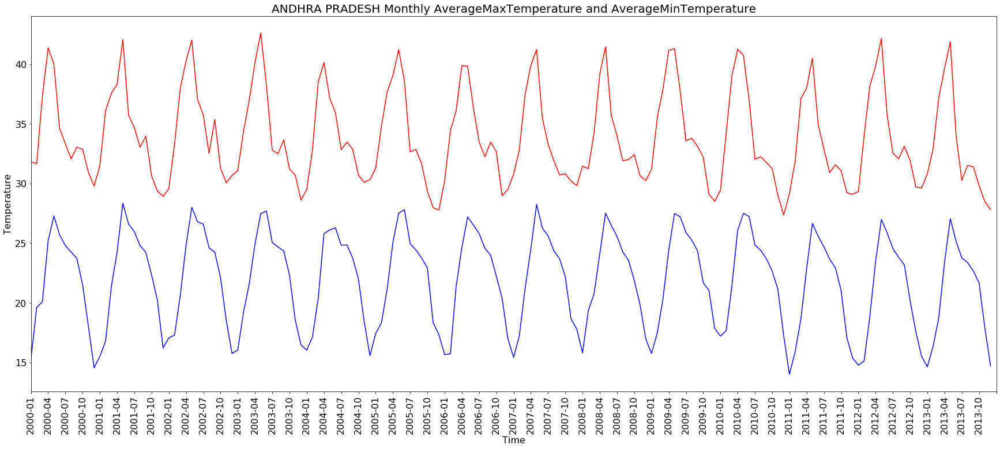

Weather  Information for ARUNACHAL PRADESH
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          3721.294111              13.516581              23.411151   
std           3749.546373               5.092575               3.313634   
min             22.223856               3.662472              15.365298   
25%            754.912103               8.606580              20.870606   
50%           2687.879925              14.255592              24.338148   
75%           5696.612129              18.685109              26.015724   
max          20068.239462              20.534524              29.850603   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.752794  
std                   0.104220  
min                   0.477046  
25%                   0.673937  
50%                   0.758963  
75%                   0.846981  
max              

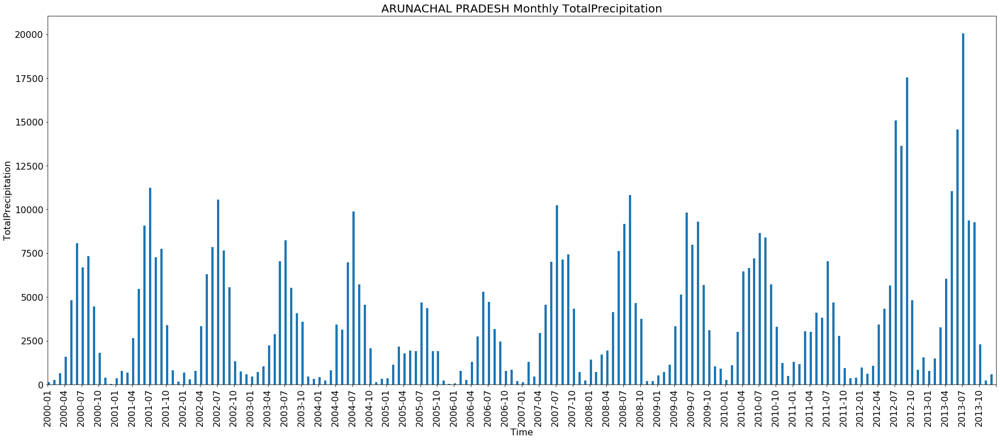

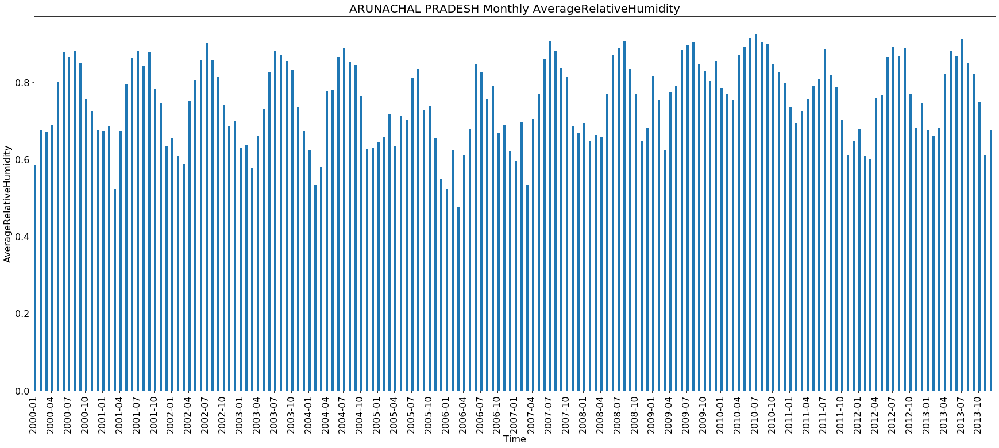

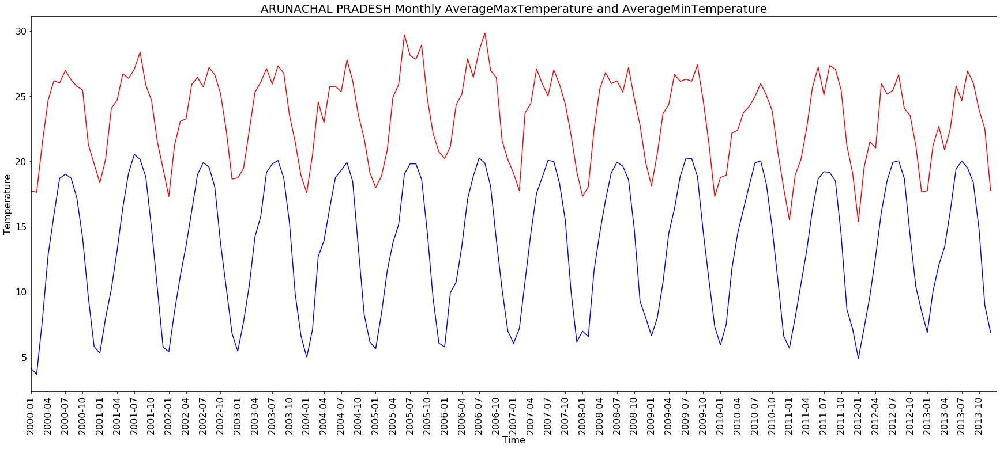

Weather  Information for ASSAM
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          6252.473523              17.789618              30.015779   
std           7565.972439               5.564278               3.189362   
min             67.957456               6.934113              22.622271   
25%            515.139322              12.491440              27.802588   
50%           3433.597984              19.140649              30.661880   
75%           9560.083192              23.241762              32.457413   
max          39793.233026              24.649870              37.231943   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.746276  
std                   0.124752  
min                   0.380179  
25%                   0.667628  
50%                   0.776770  
75%                   0.847377  
max                   0.94077

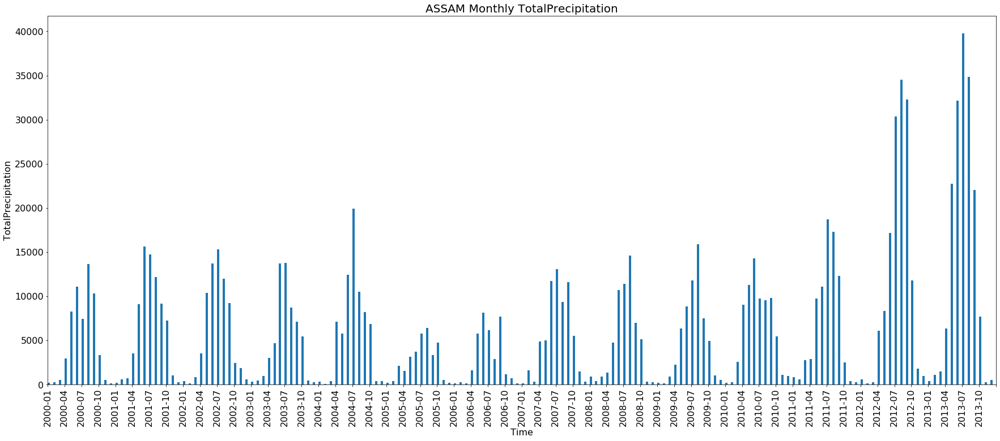

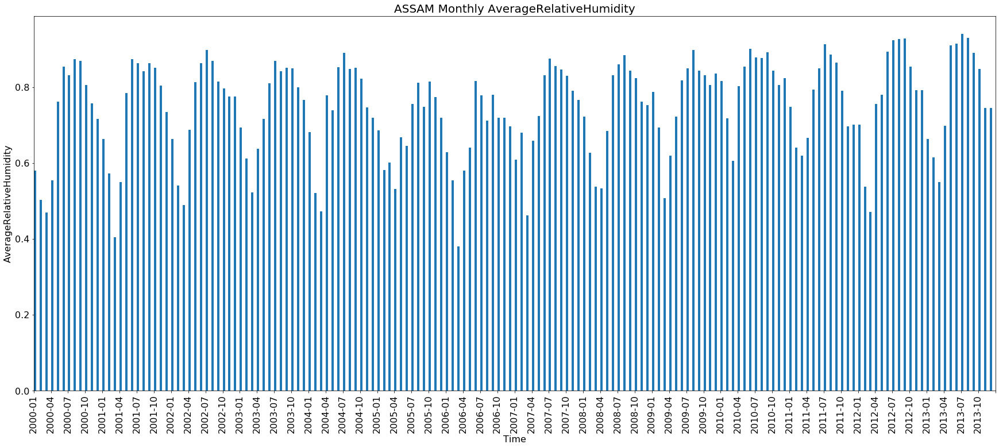

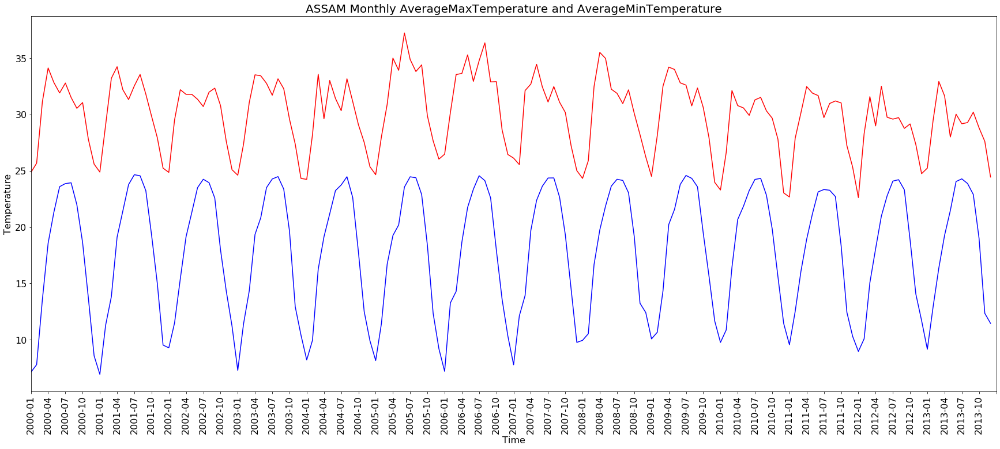

Weather  Information for BIHAR
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          4901.586361              20.333459              33.077279   
std           5430.418869               6.637583               5.418042   
min             90.894559               7.801981              22.440216   
25%            771.661319              14.073181              28.789796   
50%           2184.426239              22.157931              32.557476   
75%           7967.132124              26.398875              36.836239   
max          23648.896689              29.698165              43.492159   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.551046  
std                   0.176870  
min                   0.210068  
25%                   0.413728  
50%                   0.549937  
75%                   0.714313  
max                   0.87491

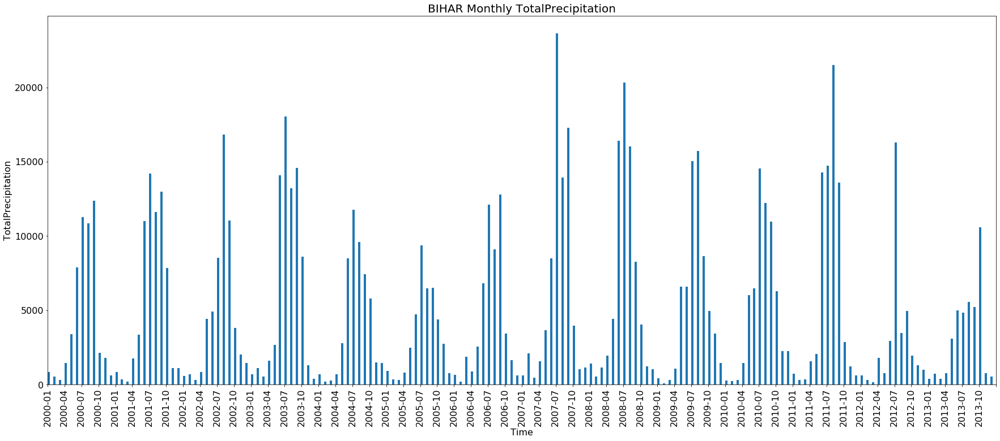

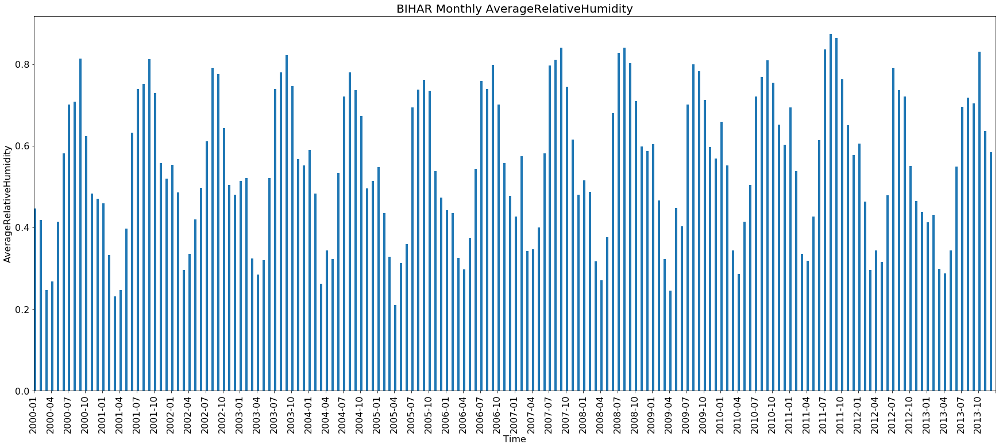

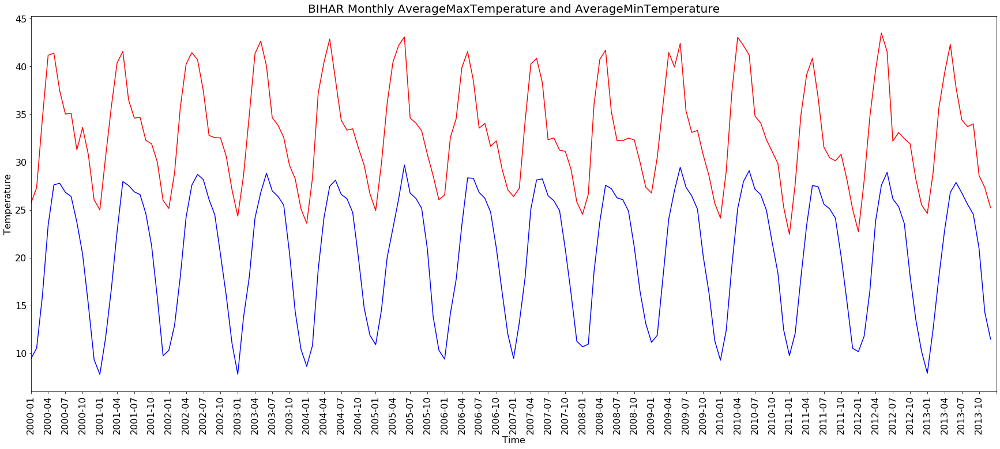

Weather  Information for CHANDIGARH
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean            64.312999              17.830977              33.204967   
std            120.023526               8.069834               7.293278   
min              0.000000               3.668742              18.115742   
25%              0.947142              10.092010              27.382292   
50%              8.991194              18.846903              33.570292   
75%             63.640854              25.771169              39.235375   
max            732.654203              29.486267              45.721567   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.415059  
std                   0.202286  
min                   0.101149  
25%                   0.239795  
50%                   0.381096  
75%                   0.569753  
max                   0.

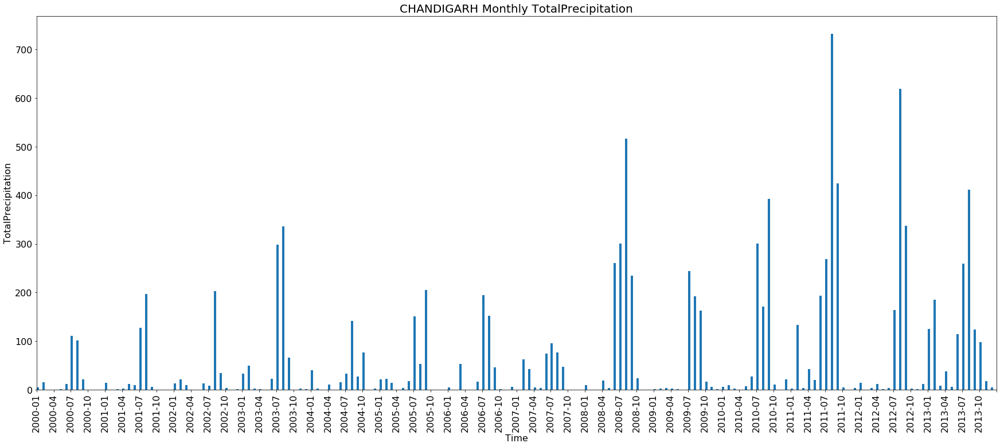

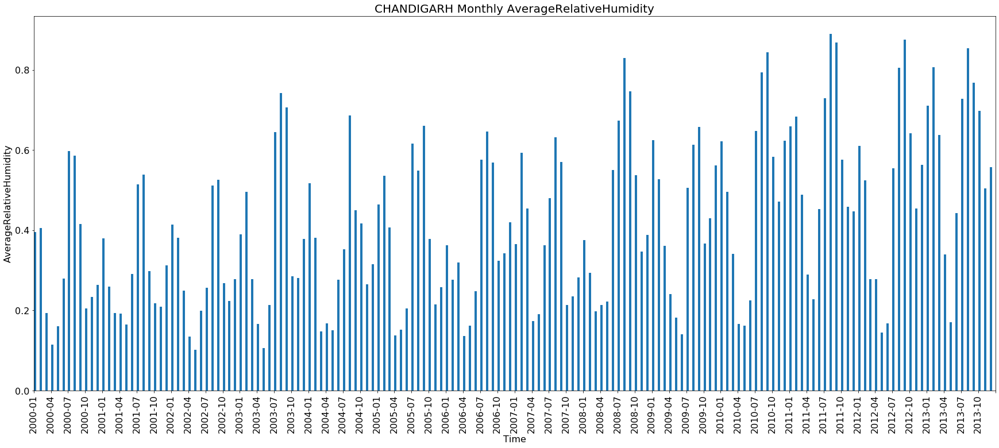

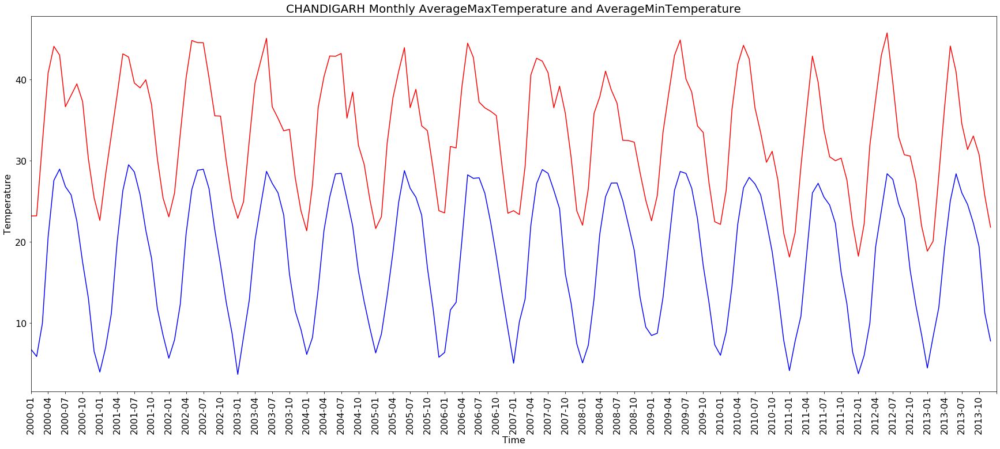

Weather  Information for CHATISGARH
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1880.543559              19.322254              33.870163   
std           2486.761311               5.580791               5.186237   
min              6.678347               7.566262              25.760386   
25%            102.220026              13.803331              29.808085   
50%            359.466127              20.626397              31.778329   
75%           3414.237494              23.931867              37.799941   
max          10035.781305              28.627414              44.770142   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.518506  
std                   0.208328  
min                   0.189554  
25%                   0.322386  
50%                   0.500721  
75%                   0.708163  
max                   0.

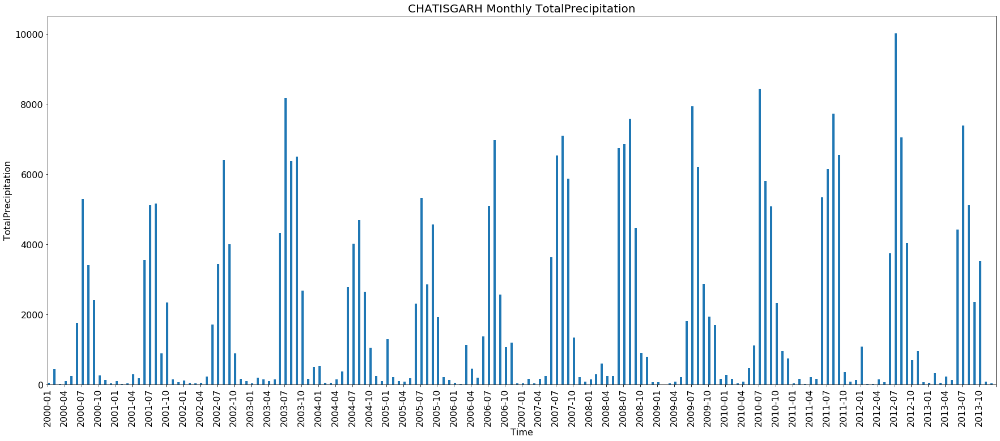

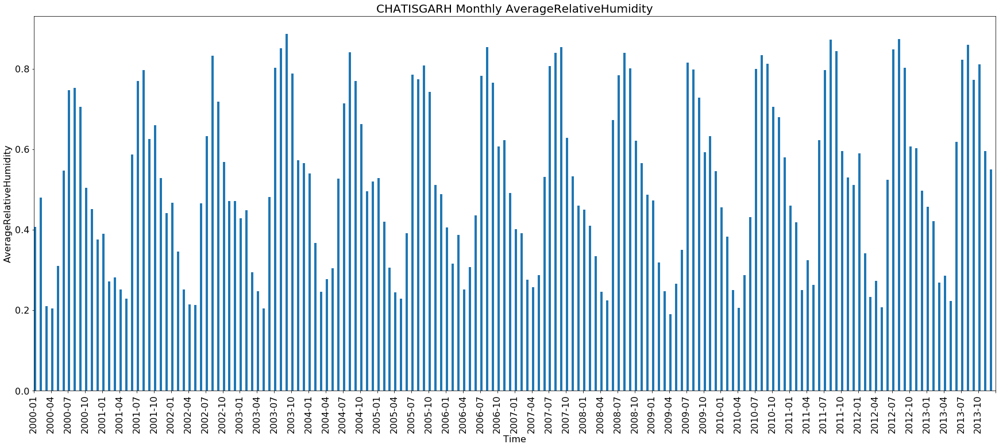

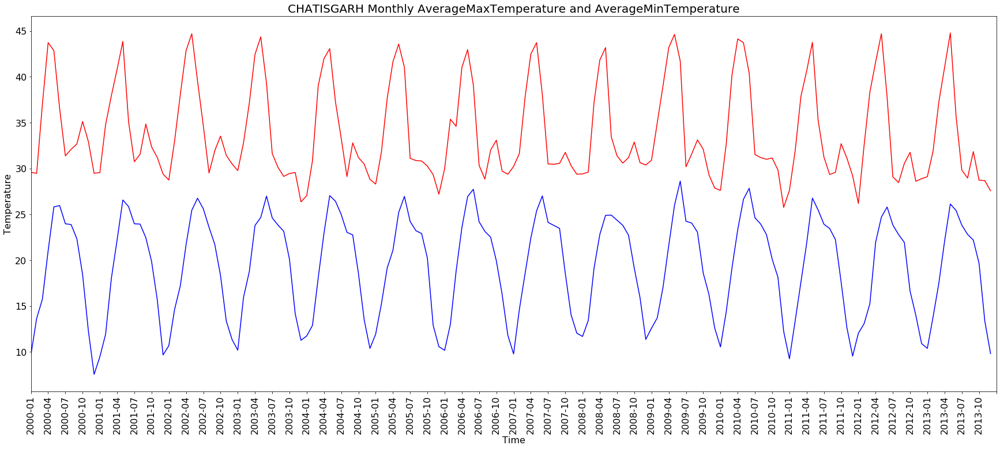

Weather  Information for DADRA AND NAGAR HAVELI
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           275.543040              26.053024              28.701225   
std            264.536114               1.715270               0.863669   
min              5.520345              21.580310              27.124903   
25%             60.043290              24.898953              28.029048   
50%            178.513384              26.811411              28.658703   
75%            423.119684              27.247226              29.370500   
max           1071.302380              28.442935              30.718129   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.704670  
std                   0.106672  
min                   0.516971  
25%                   0.605151  
50%                   0.689649  
75%                   0.816189  
max         

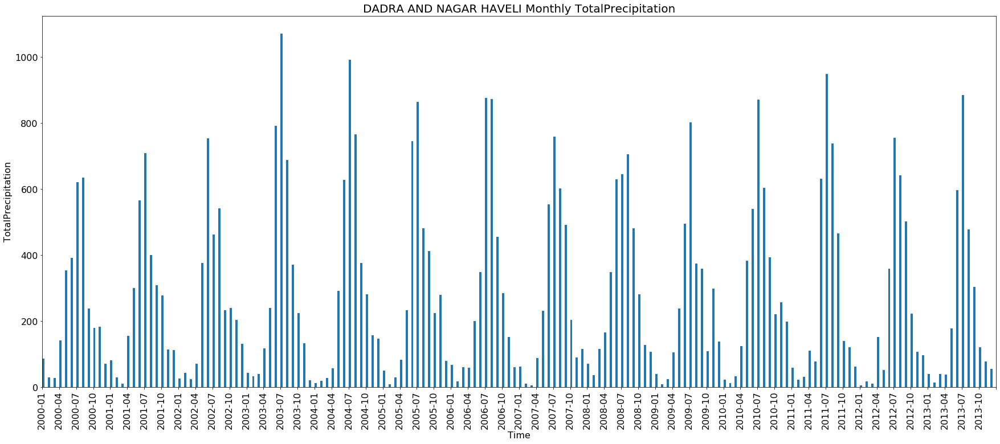

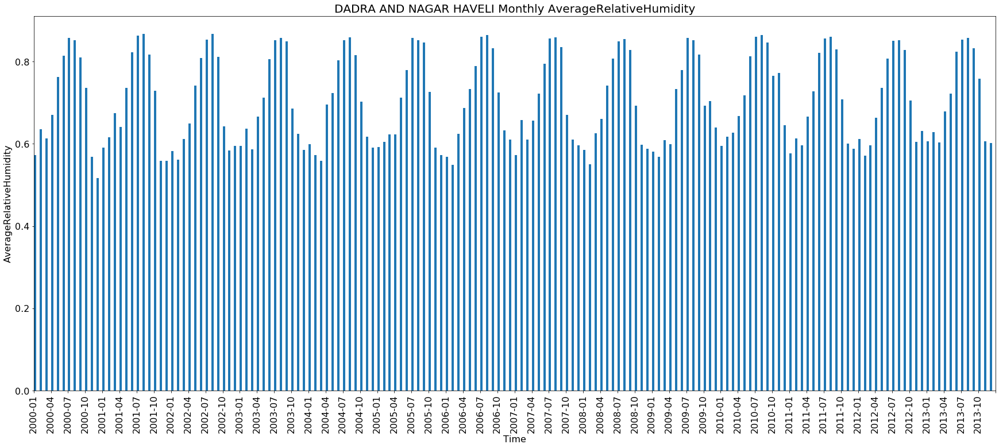

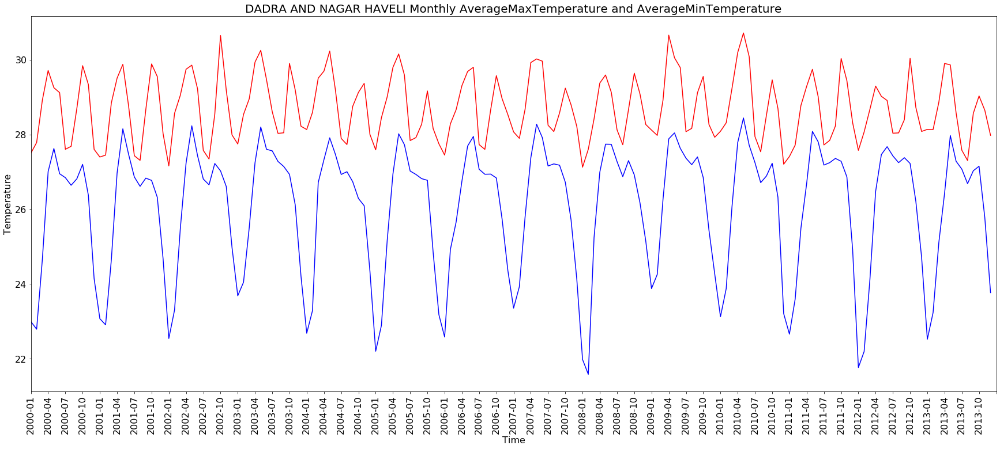

Weather  Information for DAMAN AND DIU
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           369.627549              26.437078              28.419414   
std            614.856558               2.073898               1.500197   
min              0.000000              21.392690              24.676672   
25%              0.010300              24.891835              27.623363   
50%              3.795433              27.213226              28.747613   
75%            586.171048              28.004574              29.618621   
max           2295.135976              29.483300              31.044581   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.693263  
std                   0.101628  
min                   0.509631  
25%                   0.596829  
50%                   0.692258  
75%                   0.798223  
max                  

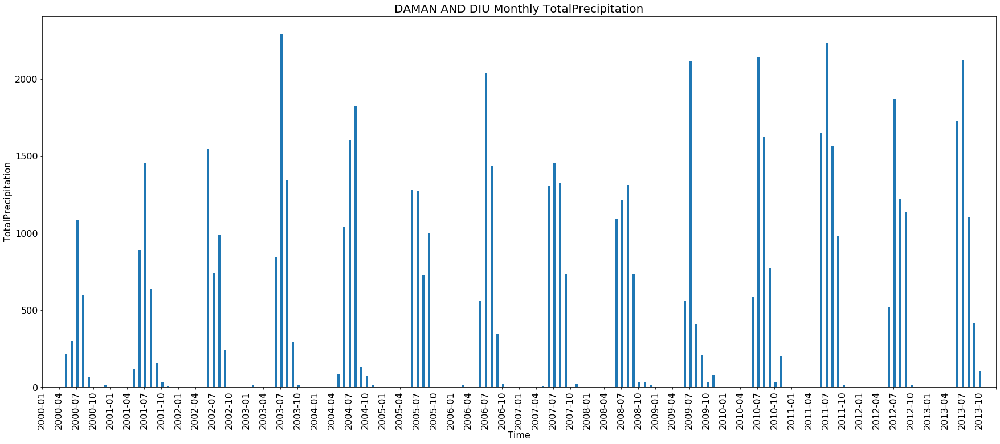

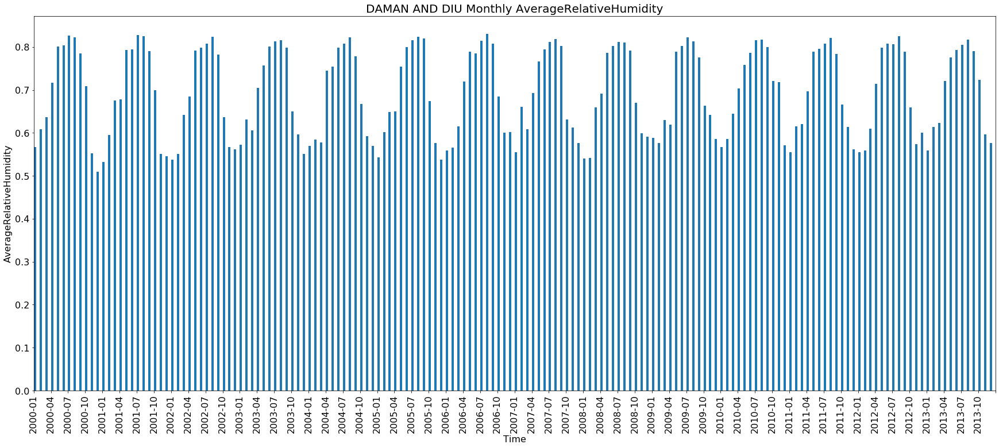

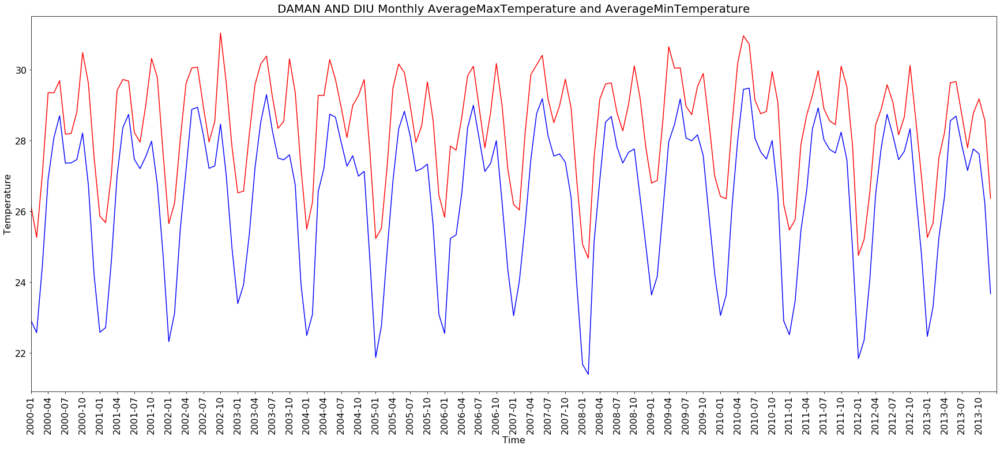

Weather  Information for GOA
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           685.291849              24.585681              30.105421   
std            913.890463               1.198187               1.984695   
min              0.000000              21.281903              26.416968   
25%              1.557398              23.901306              28.344108   
50%            115.559452              24.658863              30.387511   
75%           1418.249306              25.453361              31.665138   
max           3062.334341              27.302565              33.365417   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.720557  
std                   0.117234  
min                   0.499649  
25%                   0.610667  
50%                   0.734387  
75%                   0.832375  
max                   0.885404 

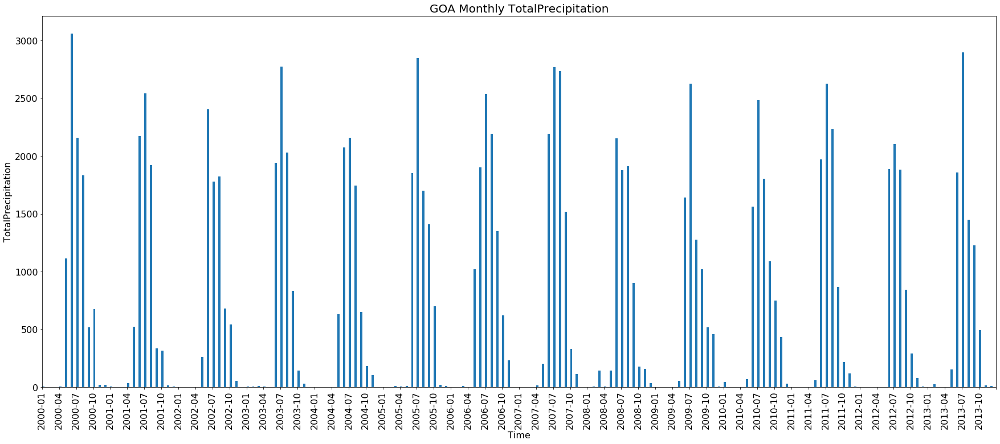

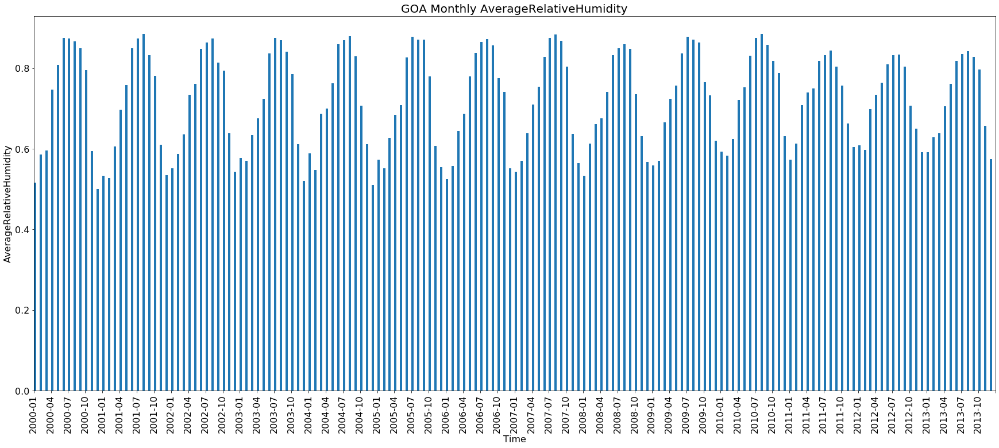

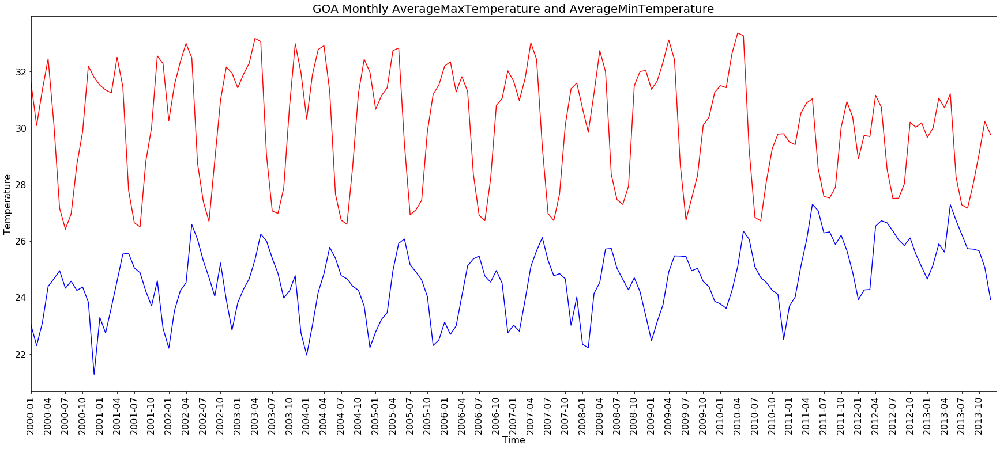

Weather  Information for GUJARAT
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          3581.645184              22.633872              33.031443   
std           3950.712324               3.900387               3.250993   
min             61.328305              14.946615              27.199476   
25%            651.700994              19.438494              30.395478   
50%           1928.972272              23.689750              32.456300   
75%           5251.069608              25.971053              35.495779   
max          19094.975261              28.452524              39.878633   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.553792  
std                   0.154616  
min                   0.346042  
25%                   0.427381  
50%                   0.494087  
75%                   0.680198  
max                   0.867

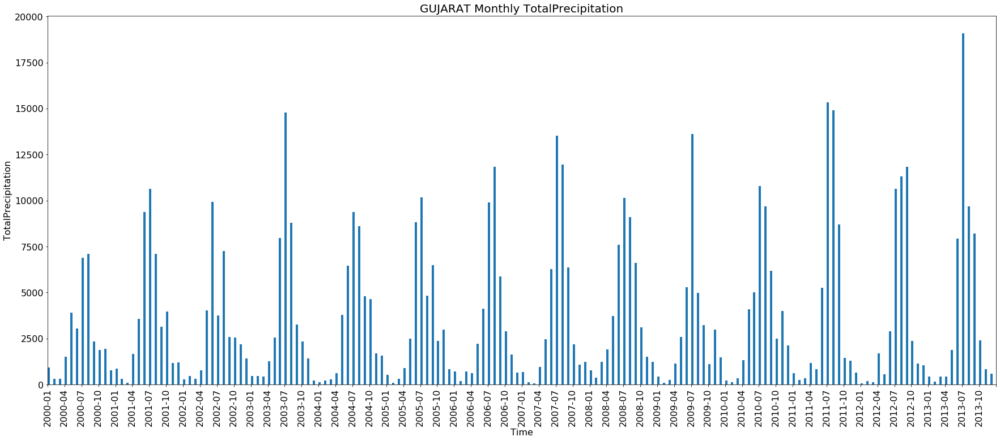

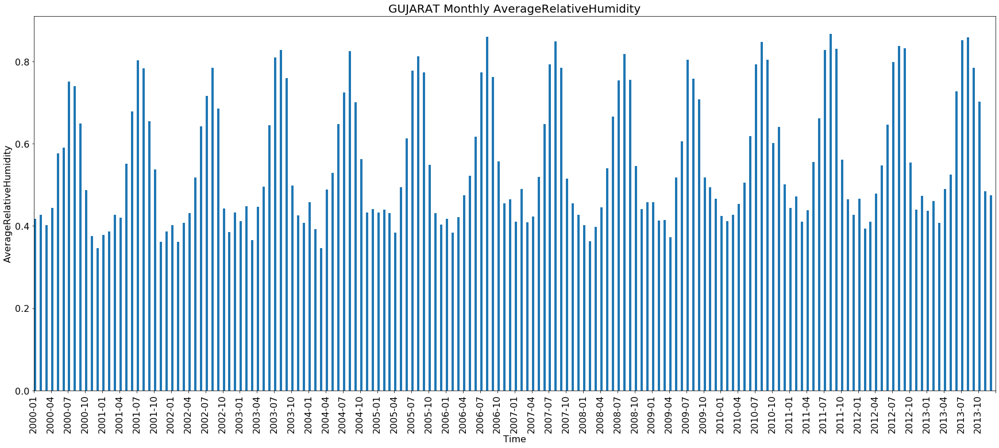

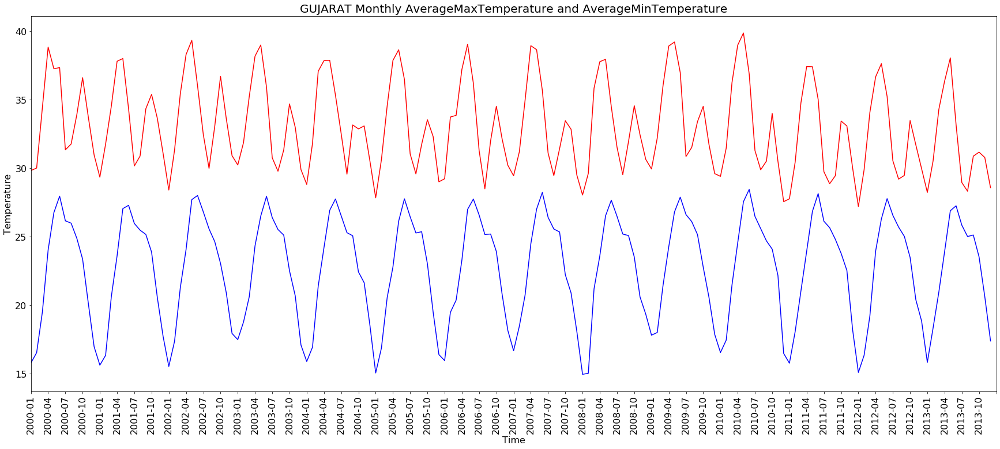

Weather  Information for HARYANA
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1543.985807              18.948587              33.403593   
std           1478.379591               8.015461               6.866235   
min             74.304018               5.225484              19.393626   
25%            501.165812              11.919561              27.780306   
50%           1080.899844              20.205394              34.177487   
75%           1984.524243              26.986846              38.479077   
max           8591.245303              30.368404              44.652557   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.450869  
std                   0.145964  
min                   0.206938  
25%                   0.336666  
50%                   0.443300  
75%                   0.548693  
max                   0.838

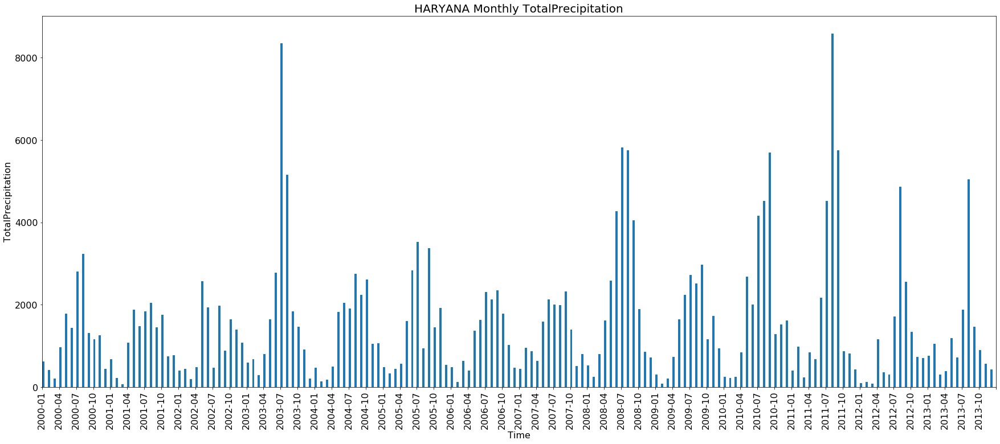

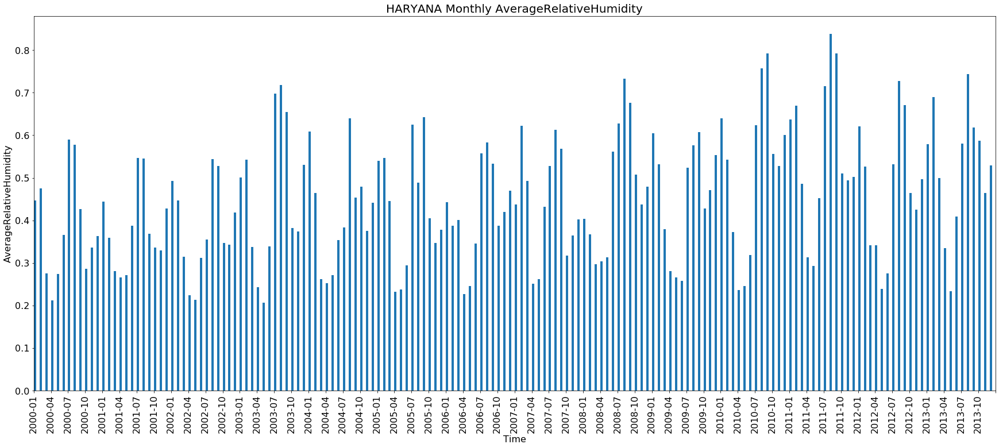

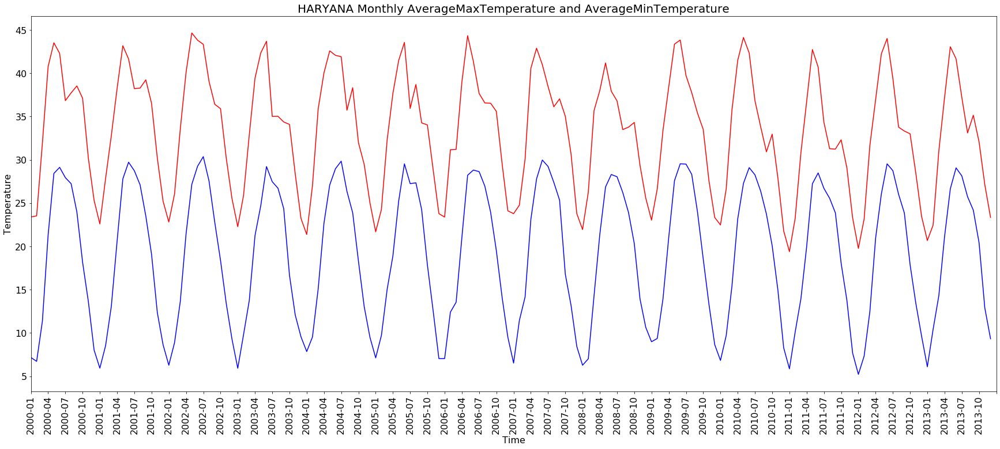

Weather  Information for HIMACHAL PRADESH
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1641.314108              13.478303              26.019462   
std           1640.747831               6.470870               5.976466   
min            132.140494               2.545433              14.641210   
25%            640.211953               7.715817              21.207047   
50%           1091.749390              14.087847              27.235813   
75%           1848.909891              19.801817              30.462212   
max           9603.326919              22.843535              37.675831   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.490988  
std                   0.153092  
min                   0.248853  
25%                   0.367826  
50%                   0.458298  
75%                   0.612916  
max               

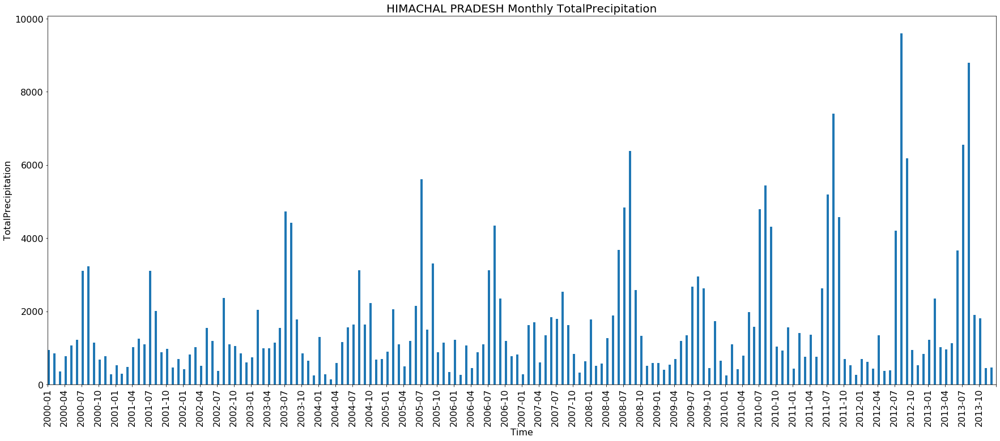

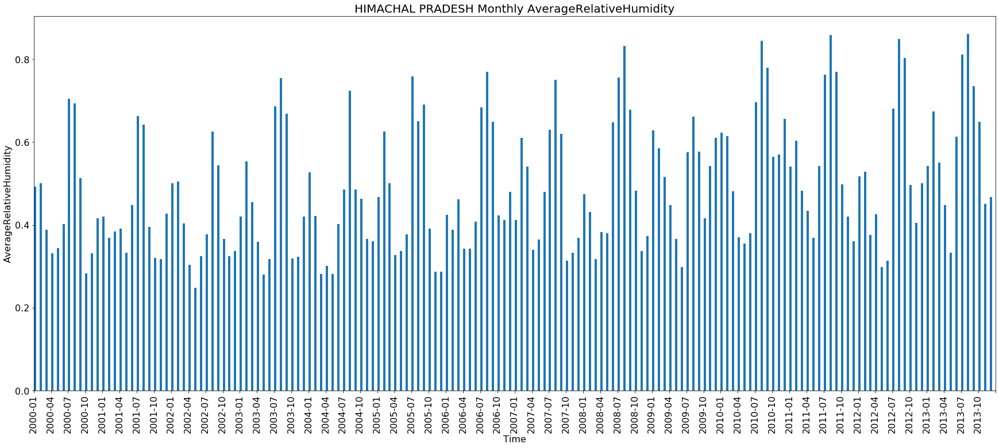

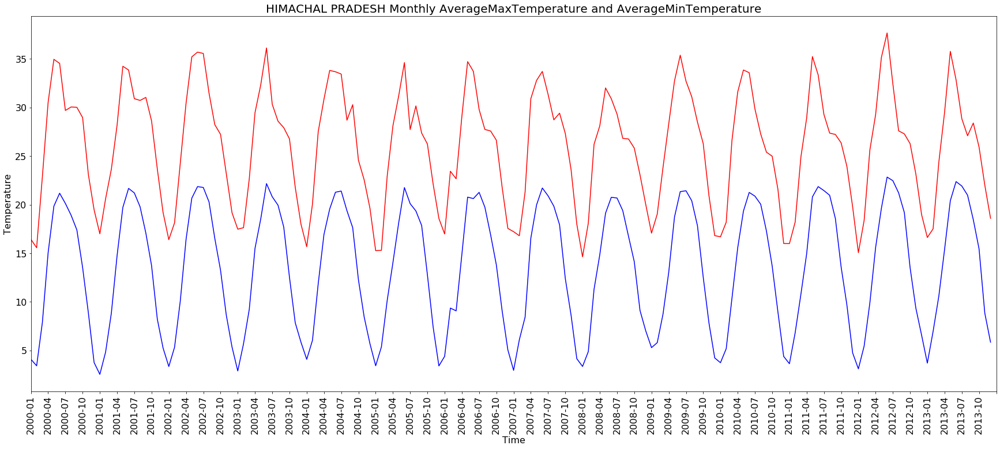

Weather  Information for JAMMU AND KASHMIR
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1549.612004               7.640070              21.000881   
std           1479.003349               6.652450               7.620865   
min            131.082346              -3.880650               6.227685   
25%            642.411265               2.032932              14.597249   
50%           1015.829710               7.503755              22.781698   
75%           2043.970517              13.407445              27.759341   
max          11769.095369              17.223352              33.334292   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.514368  
std                   0.137038  
min                   0.228693  
25%                   0.407580  
50%                   0.516516  
75%                   0.601952  
max              

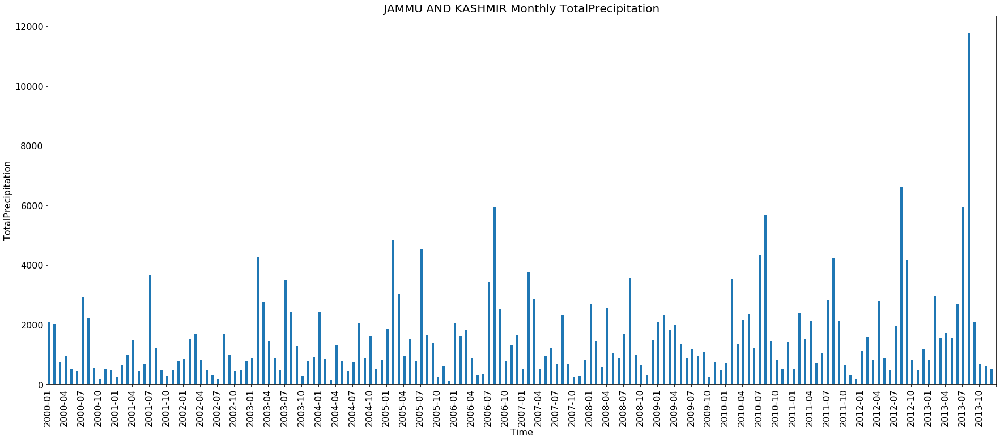

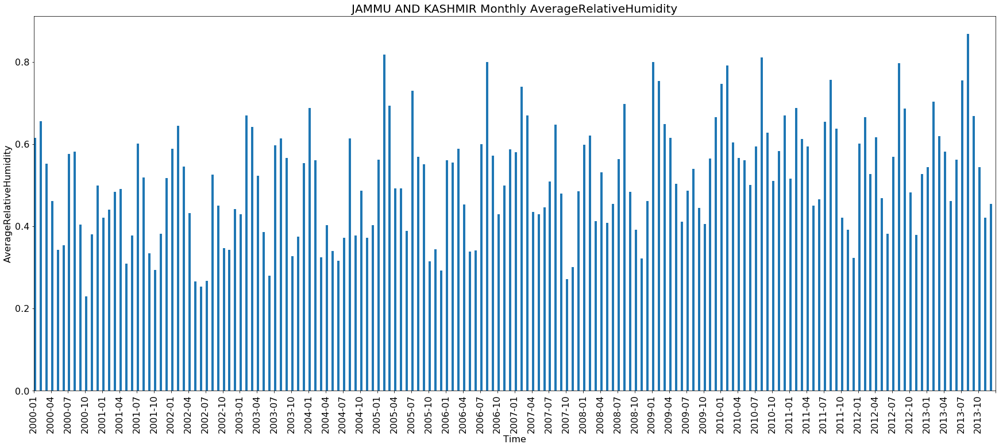

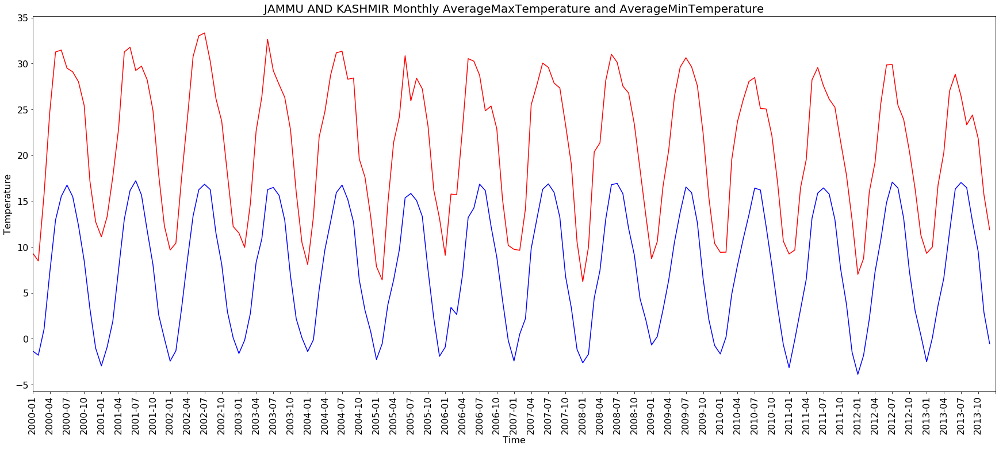

Weather  Information for JHARKHAND
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          2531.353879              19.713984              32.125359   
std           2698.636147               5.706453               4.956213   
min             44.404795               8.679444              23.546651   
25%            398.415934              14.237108              28.607165   
50%           1230.638708              21.282664              30.873561   
75%           4257.616012              24.769418              35.351998   
max          11142.792666              27.924086              42.639895   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.574594  
std                   0.185287  
min                   0.264801  
25%                   0.419000  
50%                   0.564161  
75%                   0.759293  
max                   0.8

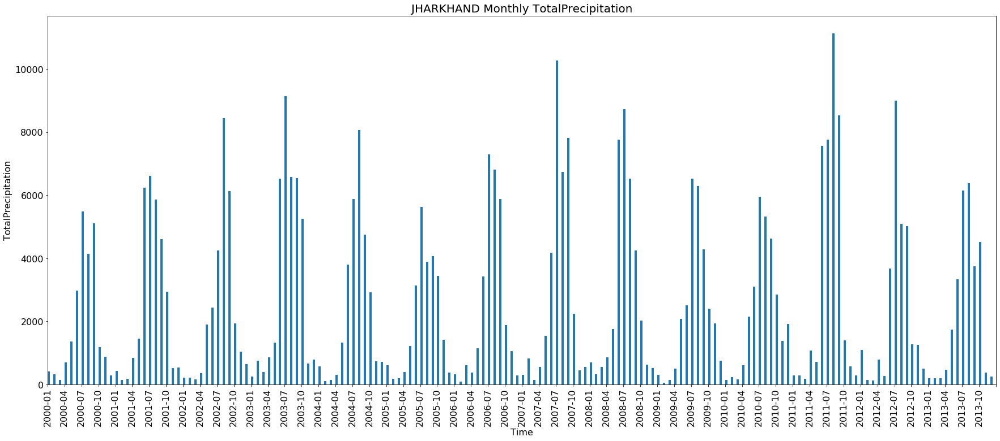

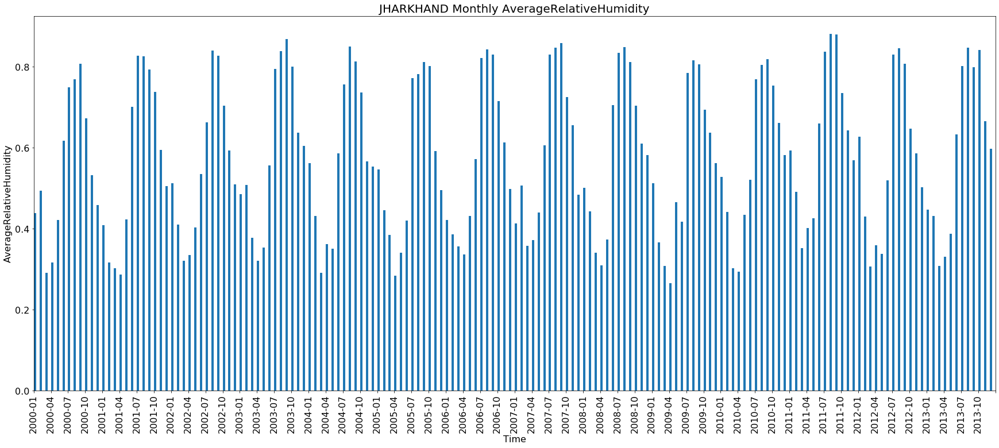

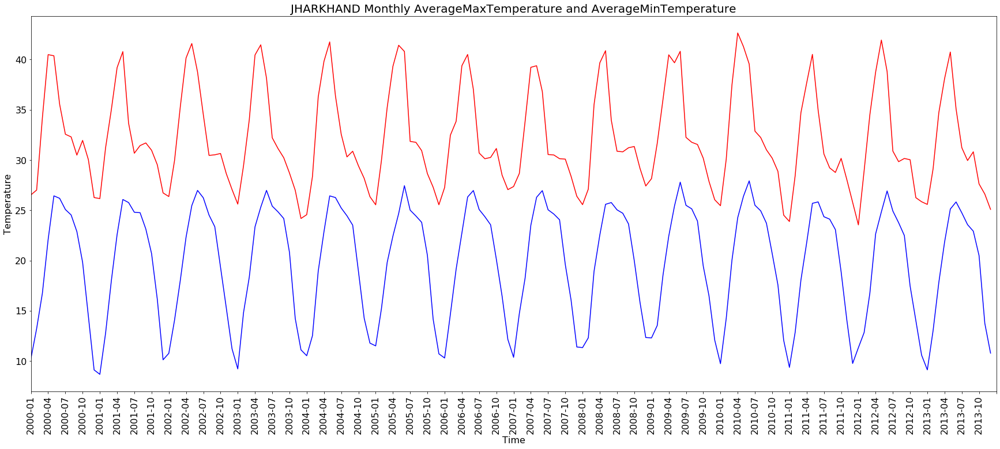

Weather  Information for KARNATAKA
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          3946.008897              19.809624              30.668825   
std           3712.100447               2.489267               3.752203   
min              0.995220              14.849776              25.223000   
25%            381.543721              17.493140              27.712120   
50%           2350.534444              20.444861              29.463855   
75%           7144.951801              21.831738              33.936599   
max          12749.631502              24.256663              38.721058   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.655618  
std                   0.154042  
min                   0.376962  
25%                   0.509886  
50%                   0.666726  
75%                   0.805015  
max                   0.8

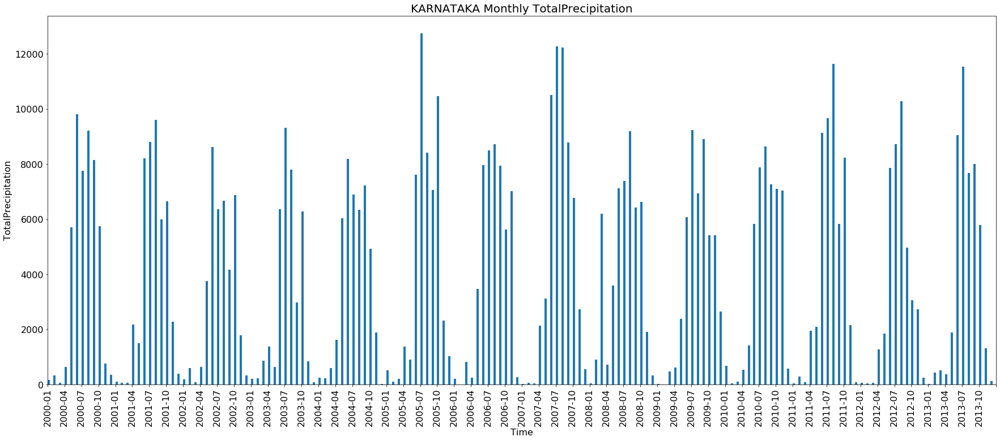

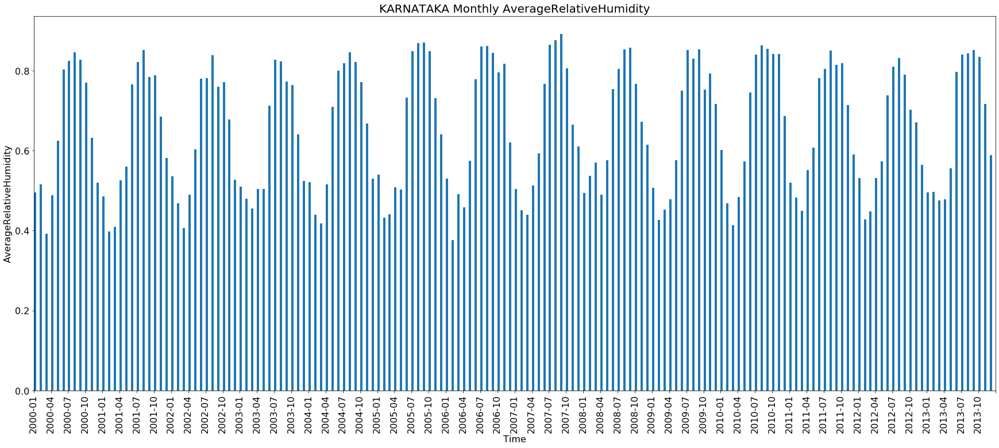

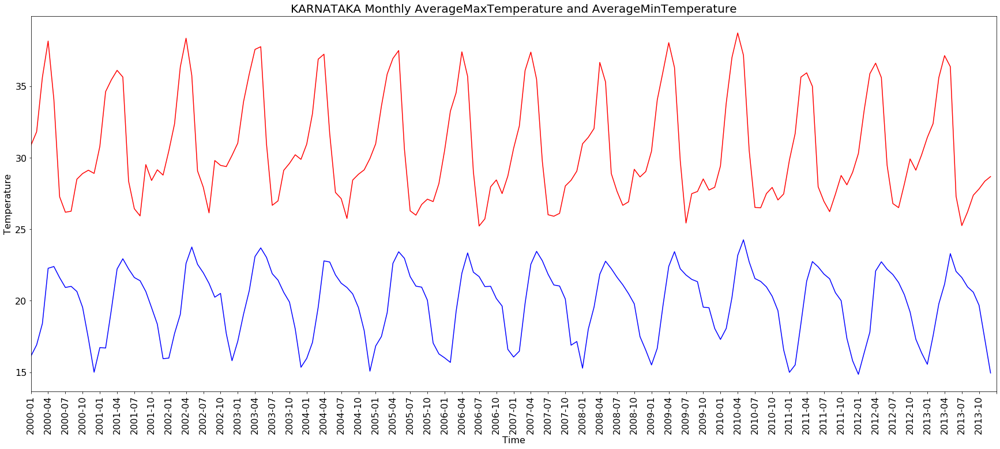

Weather  Information for KERALA
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          4880.728168              24.756026              29.635615   
std           4134.851333               1.042013               1.716049   
min             50.487448              22.328584              26.823457   
25%           1006.721878              24.271412              28.196630   
50%           3991.530630              24.694106              29.357162   
75%           7761.980810              25.382505              30.992819   
max          16900.937164              27.043449              33.060291   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.771981  
std                   0.068372  
min                   0.623876  
25%                   0.708093  
50%                   0.776675  
75%                   0.832934  
max                   0.8778

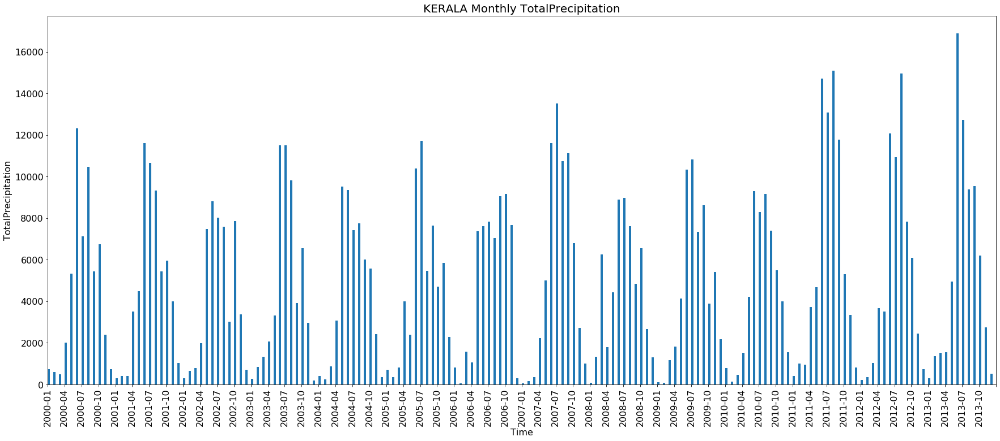

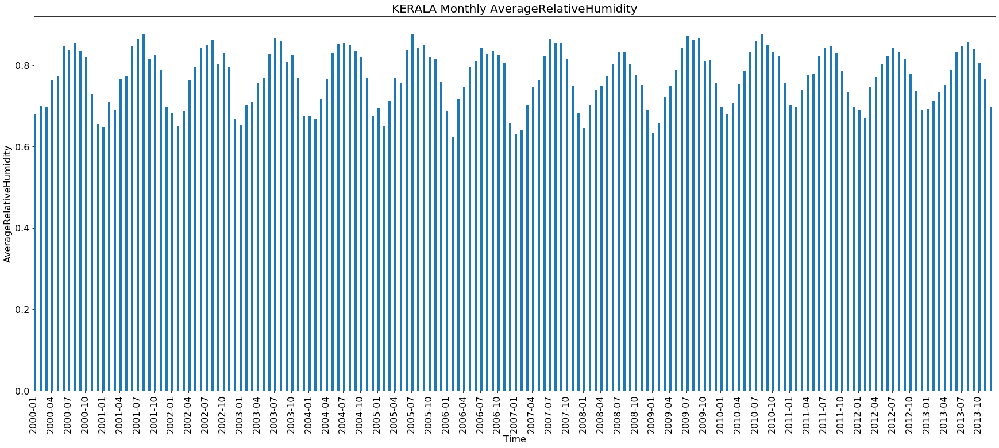

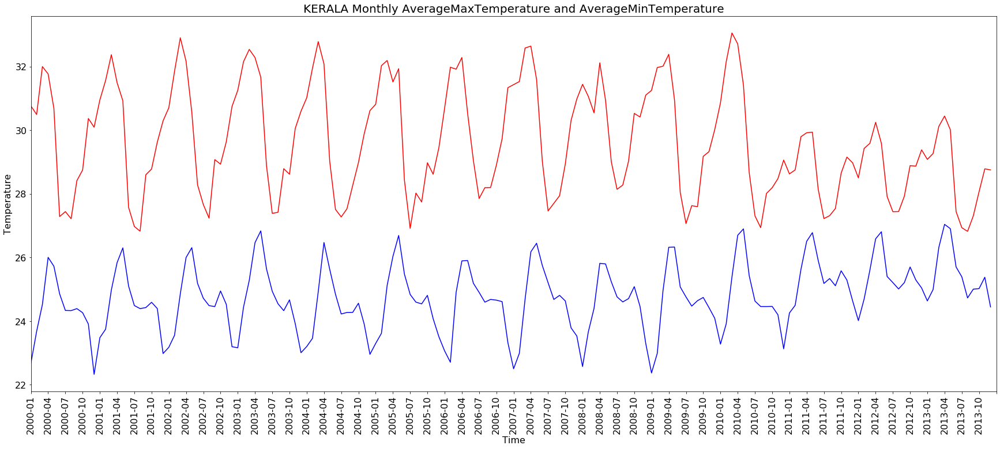

Weather  Information for LADAKH
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean            64.583339             -10.626631               1.827265   
std             50.625149               9.506639               8.031585   
min              0.902939             -28.778138             -12.083581   
25%             23.147039             -18.818522              -5.174573   
50%             53.799323             -10.076798               0.561342   
75%            103.205724              -1.490047               9.016483   
max            240.471843               5.274258              17.355081   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.656665  
std                   0.139438  
min                   0.345536  
25%                   0.548244  
50%                   0.687840  
75%                   0.772324  
max                   0.9102

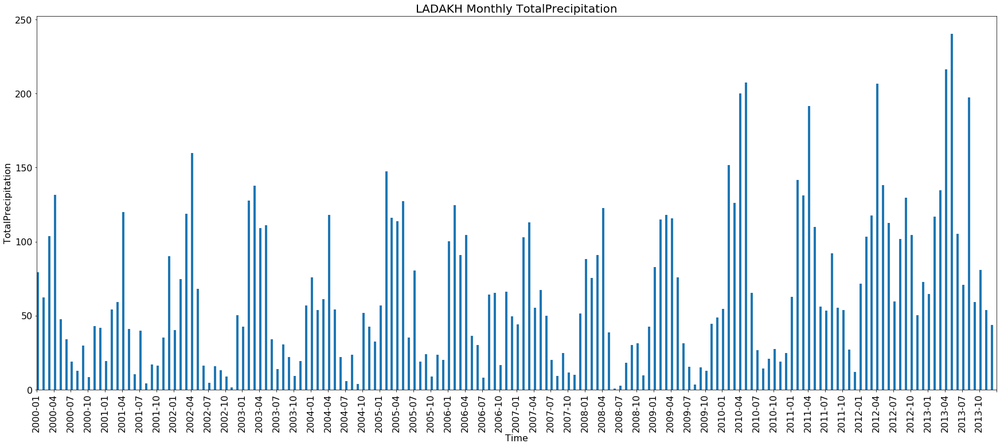

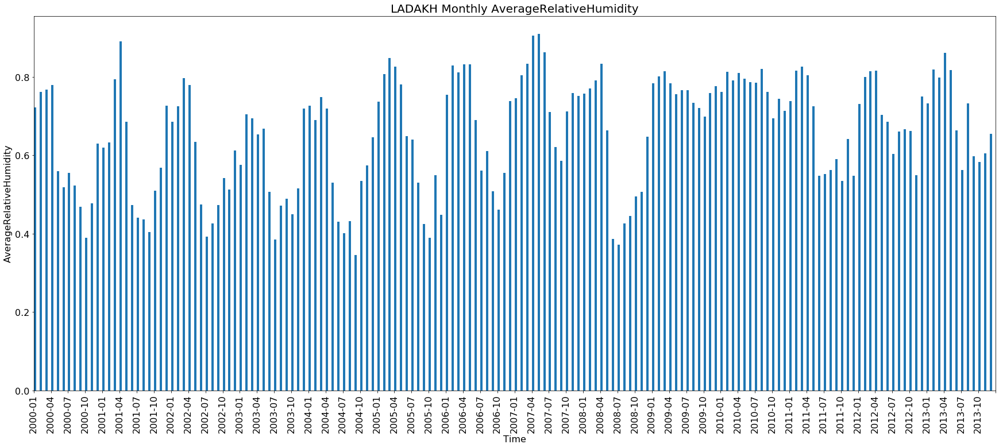

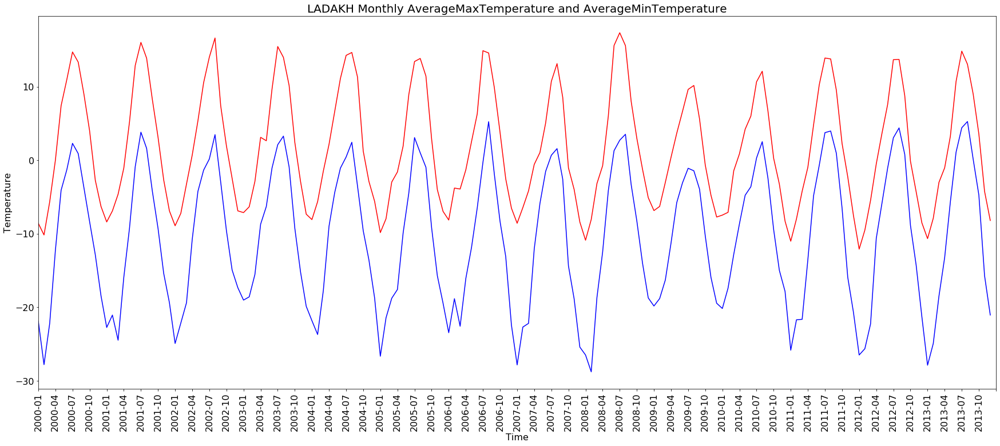

Weather  Information for LAKSHADWEEP
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           339.926013              27.206332              28.501887   
std            311.502116               0.766420               0.745553   
min              5.263996              25.683968              27.164194   
25%             60.557485              26.669363              27.955243   
50%            244.622031              27.128954              28.363023   
75%            557.394830              27.576752              28.912842   
max           1206.824474              29.215935              30.570839   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.773630  
std                   0.036959  
min                   0.682324  
25%                   0.751532  
50%                   0.784343  
75%                   0.798499  
max                   0

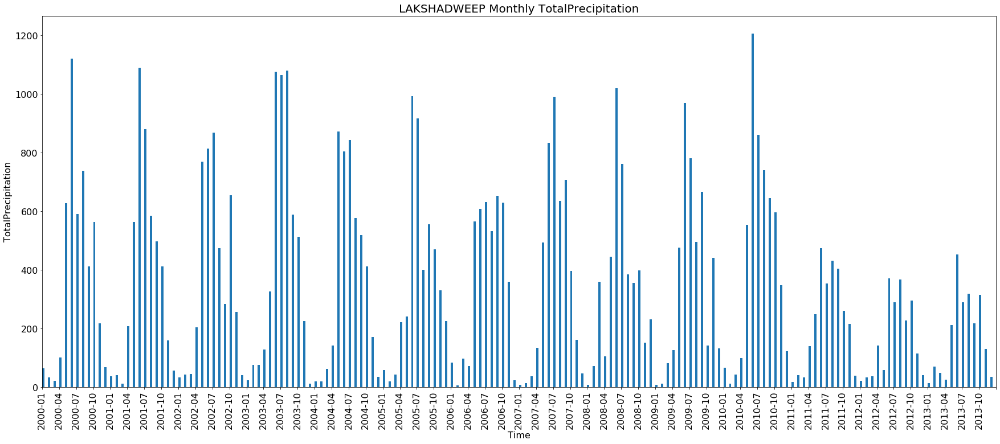

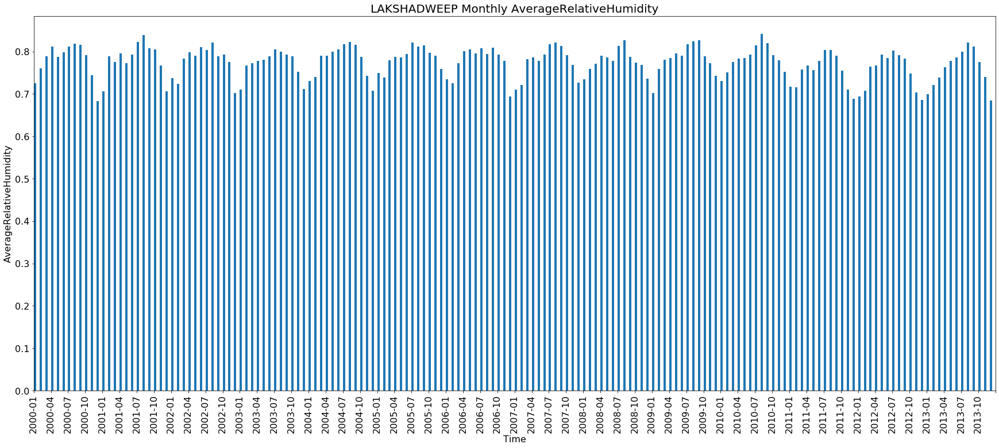

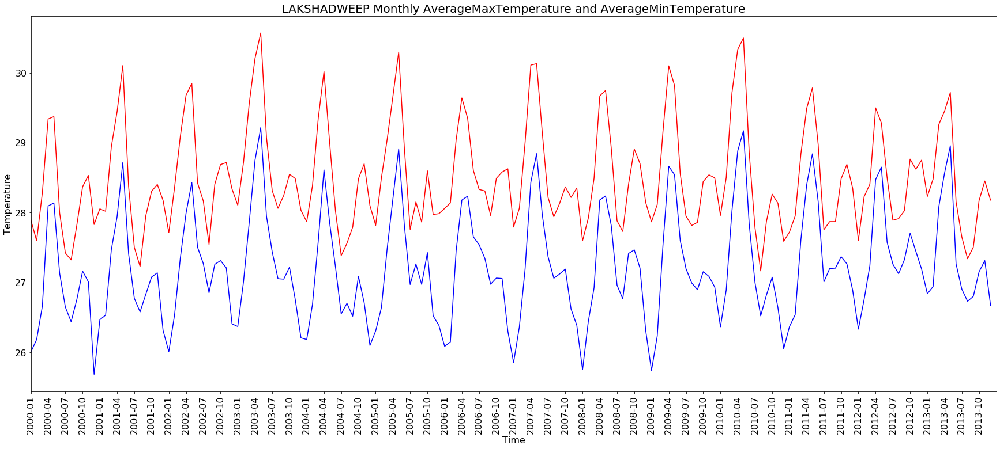

Weather  Information for MADHAYA PRADESH
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          4370.008793              18.997718              33.223926   
std           6604.162186               6.193515               5.061040   
min             25.743772               7.718401              24.479395   
25%            265.655891              13.384812              29.462697   
50%            741.230169              20.021011              31.423249   
75%           5762.225455              23.896339              36.669986   
max          28995.132750              28.839718              44.019427   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.470982  
std                   0.221677  
min                   0.152978  
25%                   0.277995  
50%                   0.434557  
75%                   0.616377  
max                

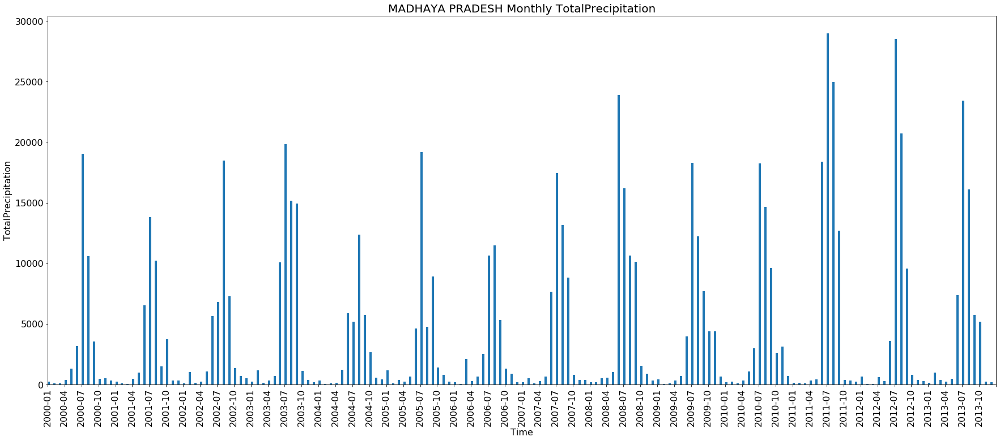

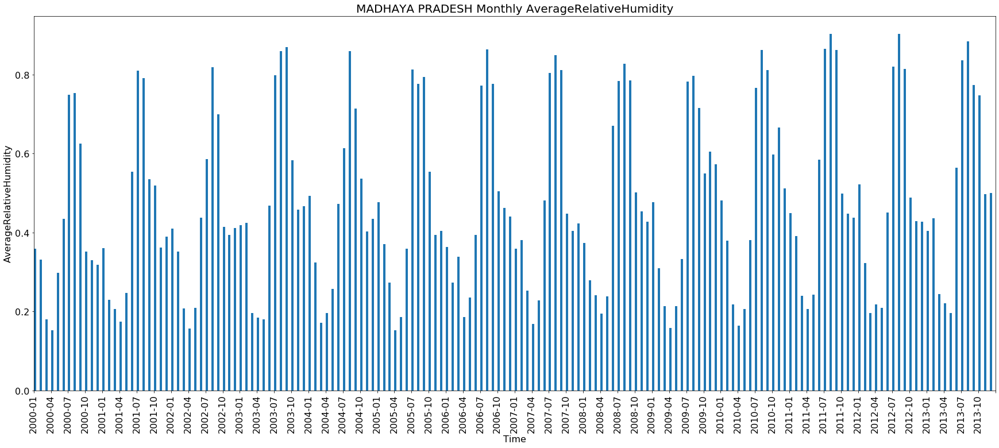

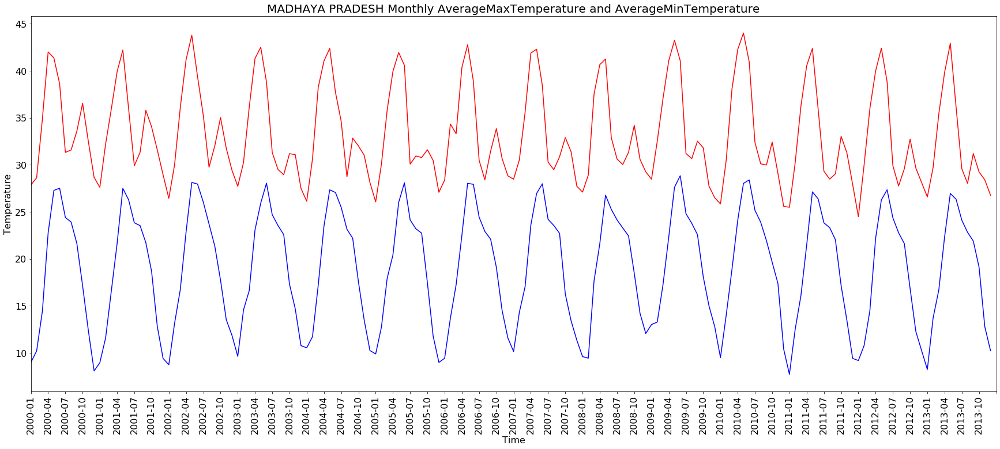

Weather  Information for MAHARASHTRA
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          4862.292562              21.121172              32.307044   
std           6049.477852               3.750899               3.976902   
min             25.327606              13.818051              26.231539   
25%            259.650710              17.592888              29.096599   
50%           1076.428561              22.010555              31.002871   
75%           9998.888173              23.932730              35.481684   
max          23081.233059              27.544676              40.652355   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.544802  
std                   0.199101  
min                   0.260567  
25%                   0.381227  
50%                   0.483796  
75%                   0.731820  
max                   0

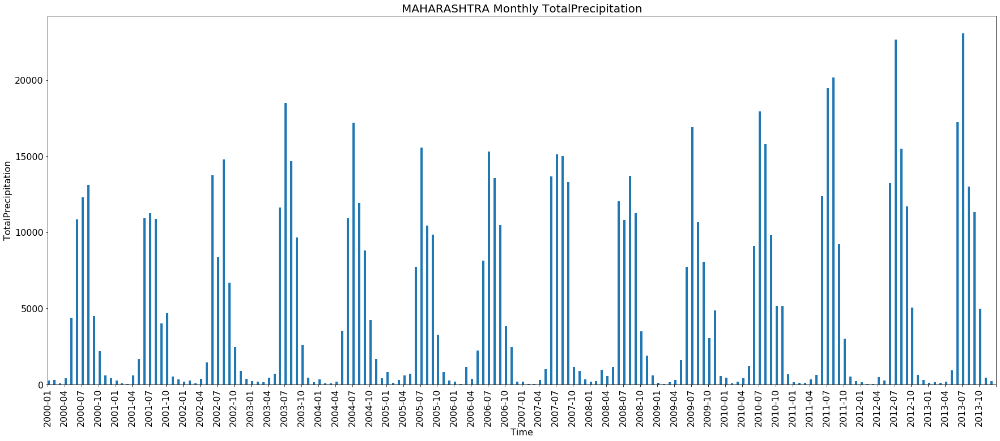

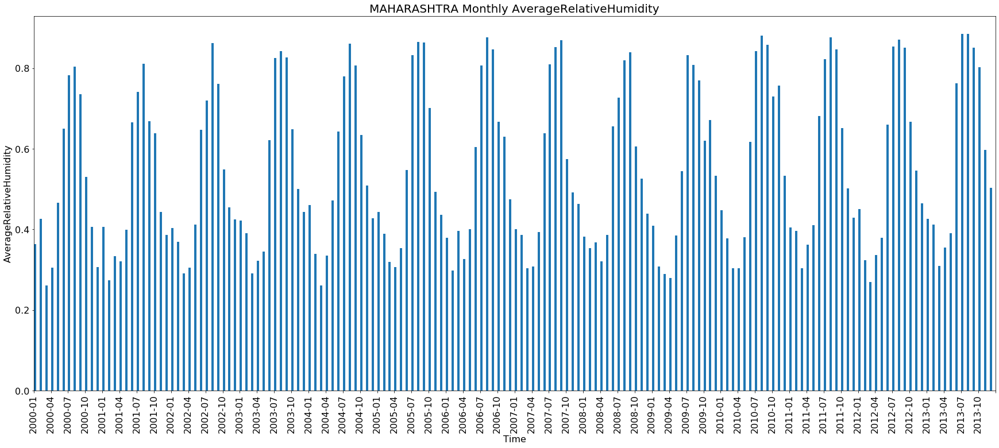

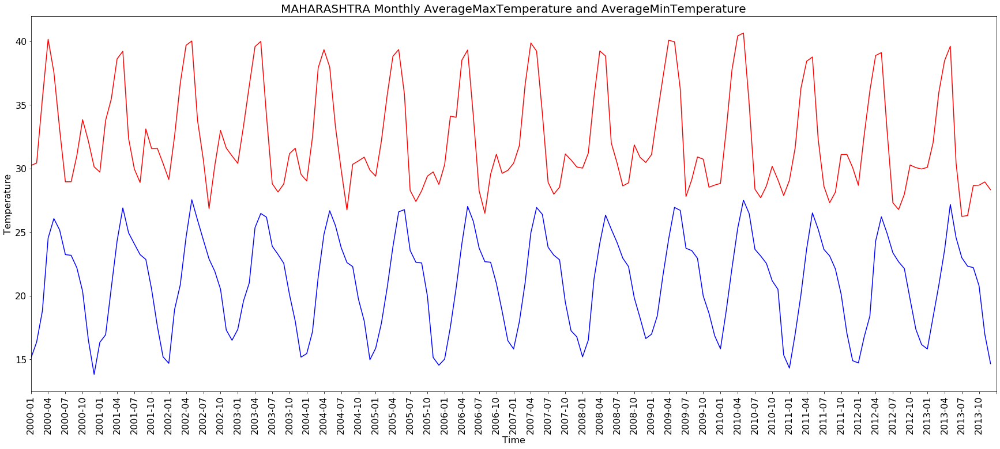

Weather  Information for MANIPUR
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           826.781950              14.681884              27.140828   
std            845.487544               5.453228               2.469436   
min              0.195694               3.263984              21.617935   
25%             55.855624               9.728536              25.706108   
50%            596.178659              16.377964              27.474598   
75%           1469.586584              19.842926              28.758101   
max           4043.832862              21.673247              32.022744   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.772880  
std                   0.129023  
min                   0.442405  
25%                   0.688262  
50%                   0.794681  
75%                   0.886683  
max                   0.937

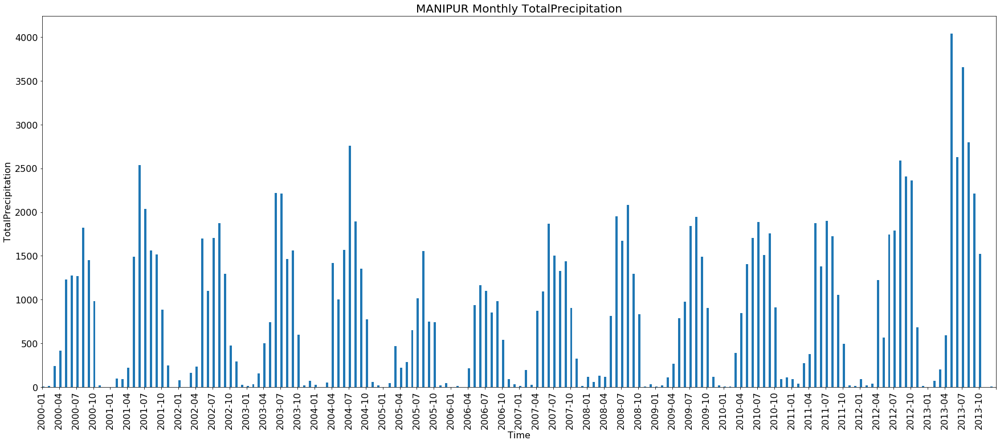

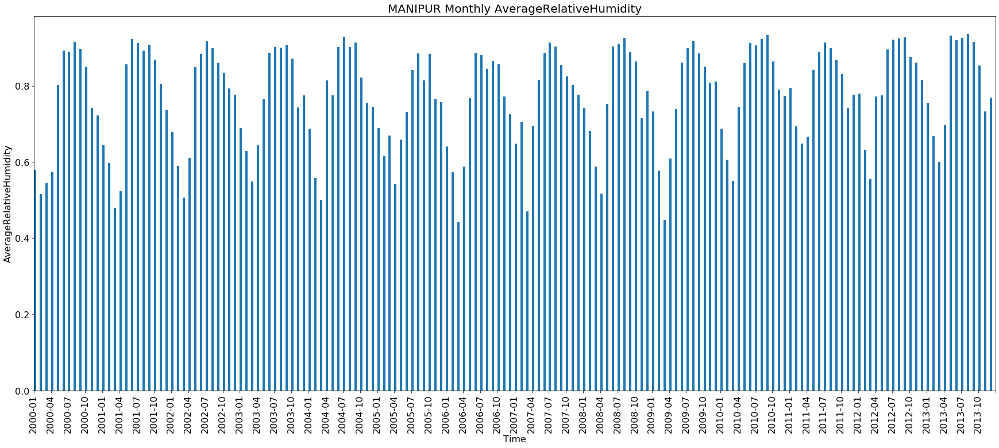

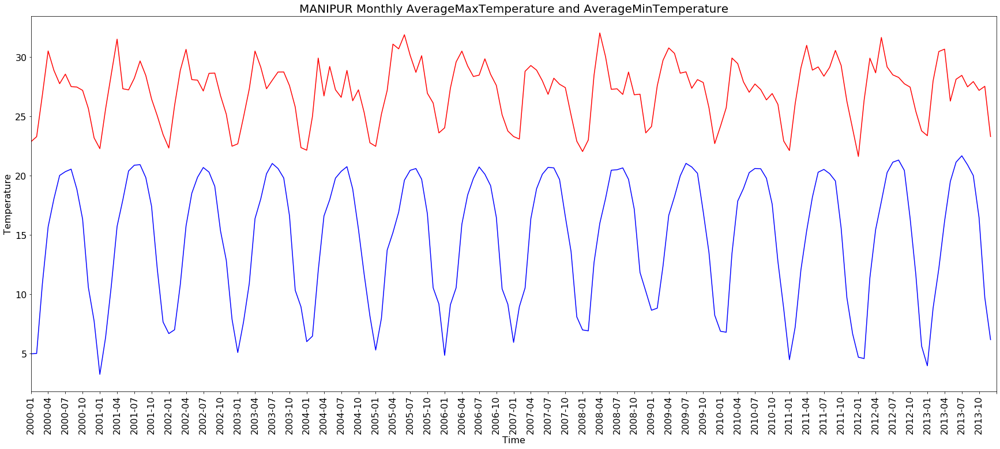

Weather  Information for MEGHALAYA
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1130.204901              18.337710              28.884716   
std           1197.996040               4.625706               2.533495   
min              7.034683               8.896371              23.696238   
25%             87.698530              14.078510              27.403101   
50%            789.552326              19.742369              28.976712   
75%           1872.743189              22.698222              30.311141   
max           6015.757854              24.282787              34.596396   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.726716  
std                   0.150683  
min                   0.374128  
25%                   0.607822  
50%                   0.747386  
75%                   0.864195  
max                   0.9

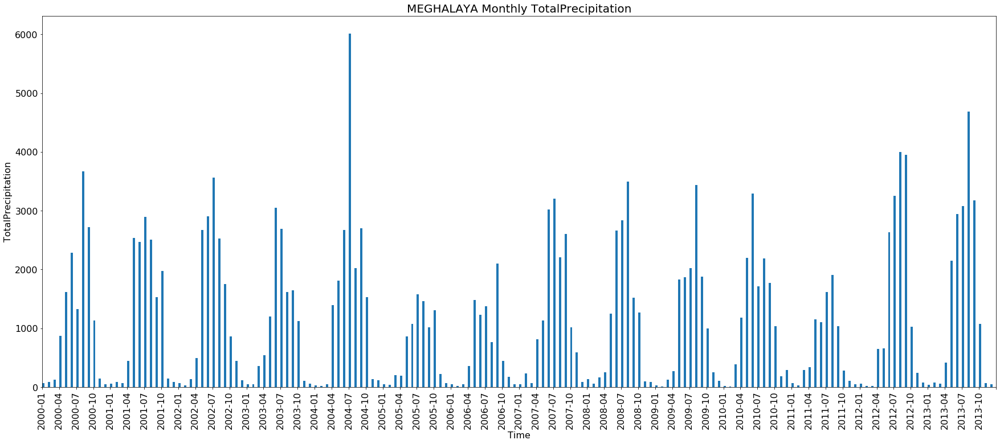

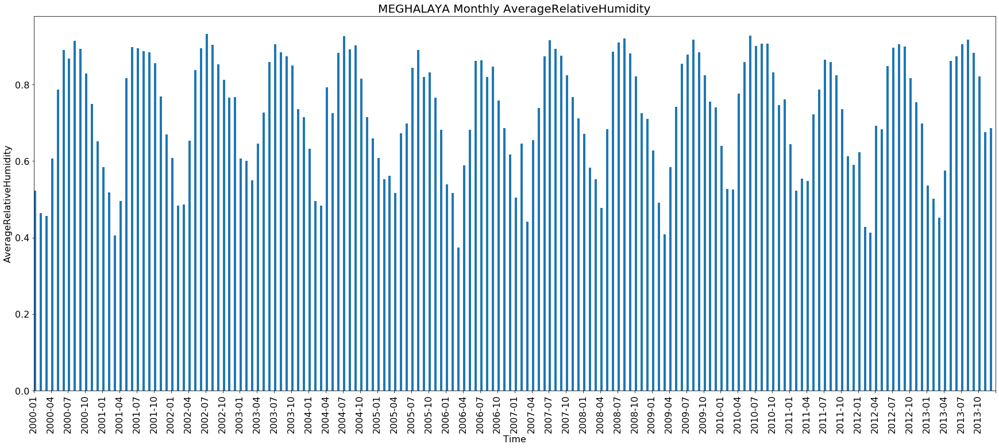

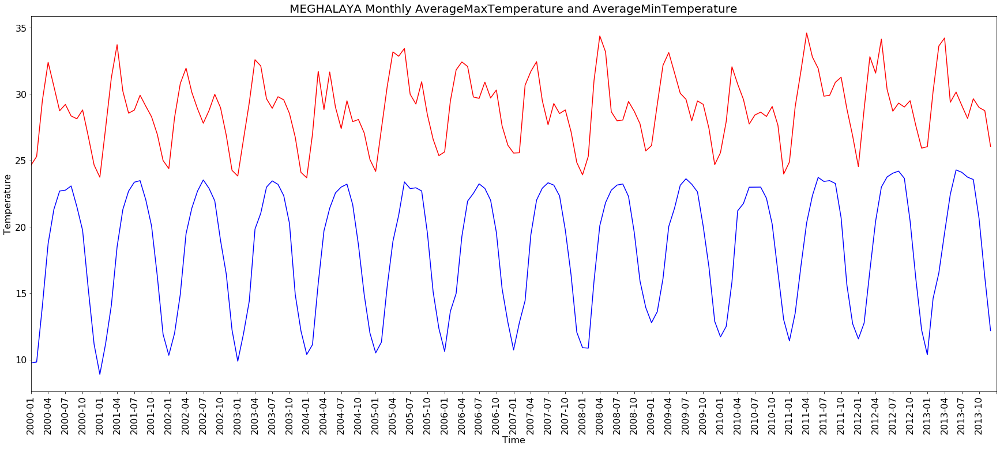

Weather  Information for MIZORAM
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           437.935141              17.943262              30.926245   
std            486.452479               5.117151               2.887058   
min              0.000000               5.820984              25.495871   
25%             19.521799              13.215154              29.313998   
50%            294.667999              20.204369              30.738738   
75%            712.488897              22.529876              32.753976   
max           2492.817069              23.892333              37.579750   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.735944  
std                   0.151302  
min                   0.381460  
25%                   0.611487  
50%                   0.770178  
75%                   0.863078  
max                   0.936

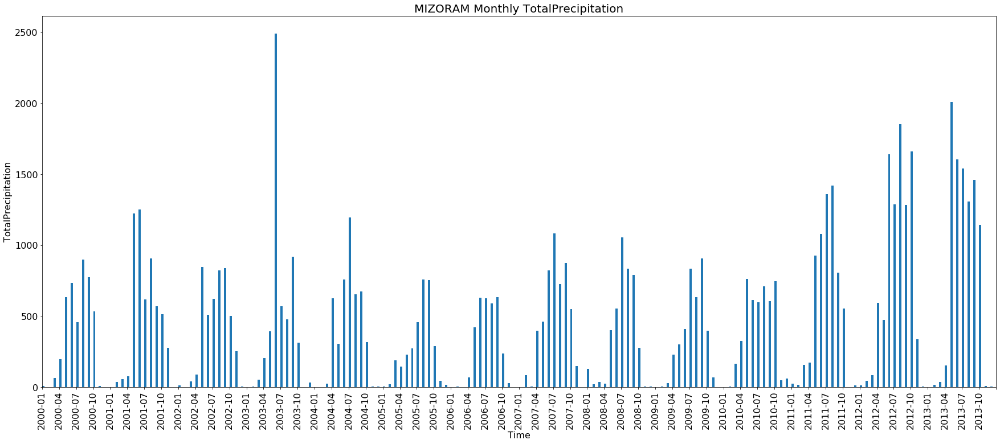

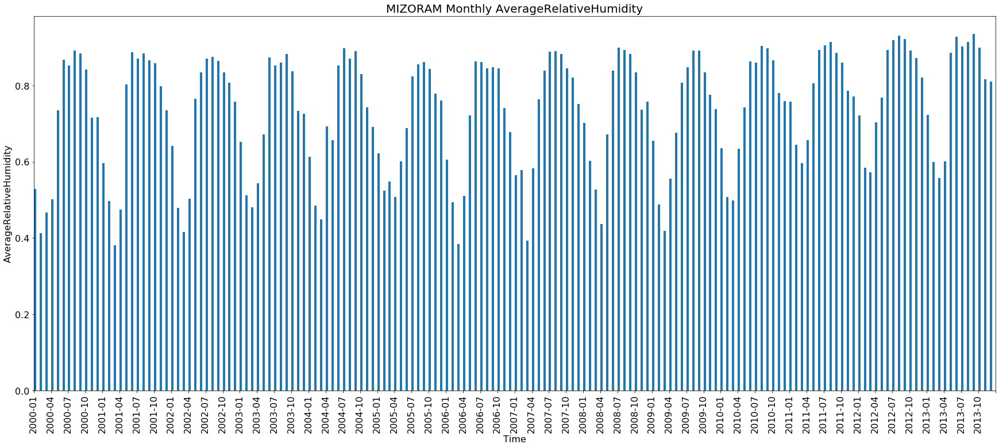

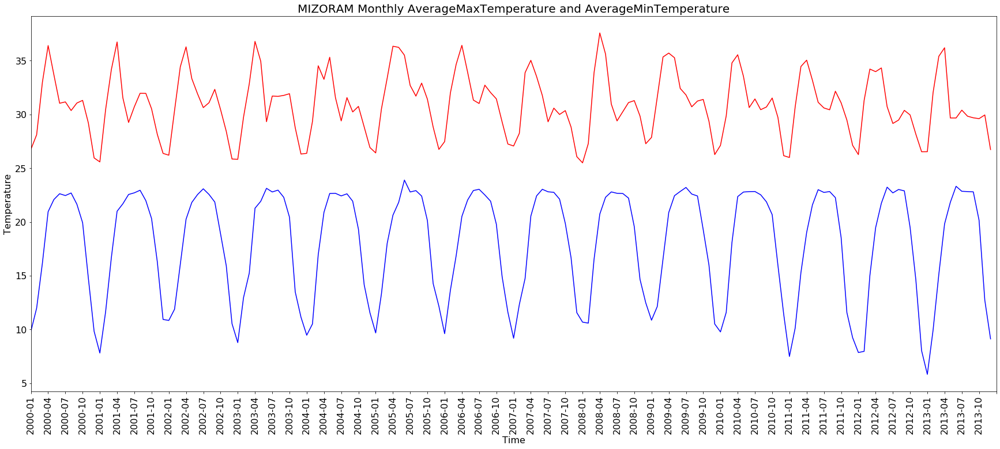

Weather  Information for NAGALAND
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1308.818032              11.656239              22.790927   
std           1122.435428               5.756763               2.520282   
min              1.912307               0.369363              15.542391   
25%            198.408161               6.396402              21.175878   
50%           1180.923692              12.601122              23.414036   
75%           2178.684118              17.549025              24.640773   
max           4158.481396              19.587056              27.322738   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.840818  
std                   0.097428  
min                   0.506793  
25%                   0.792551  
50%                   0.860743  
75%                   0.925197  
max                   0.96

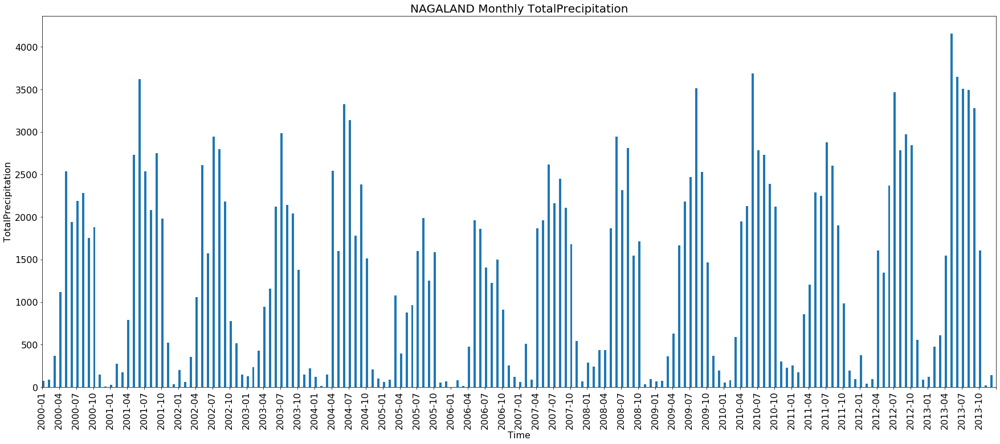

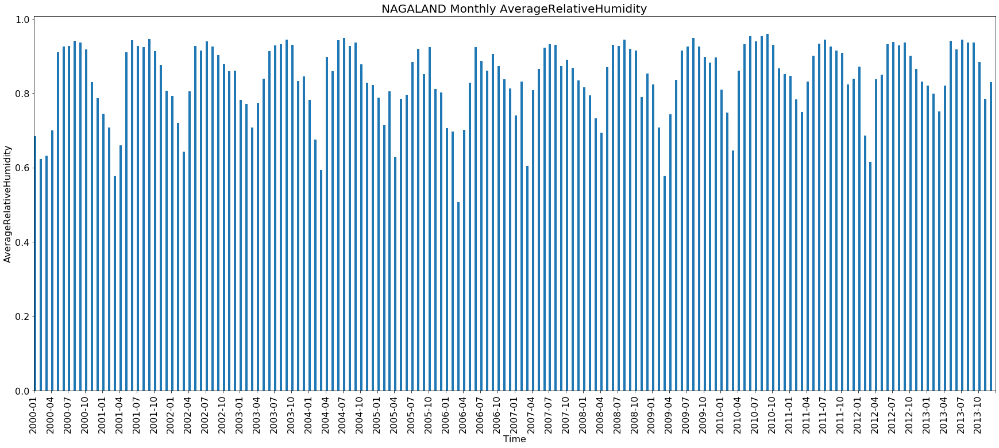

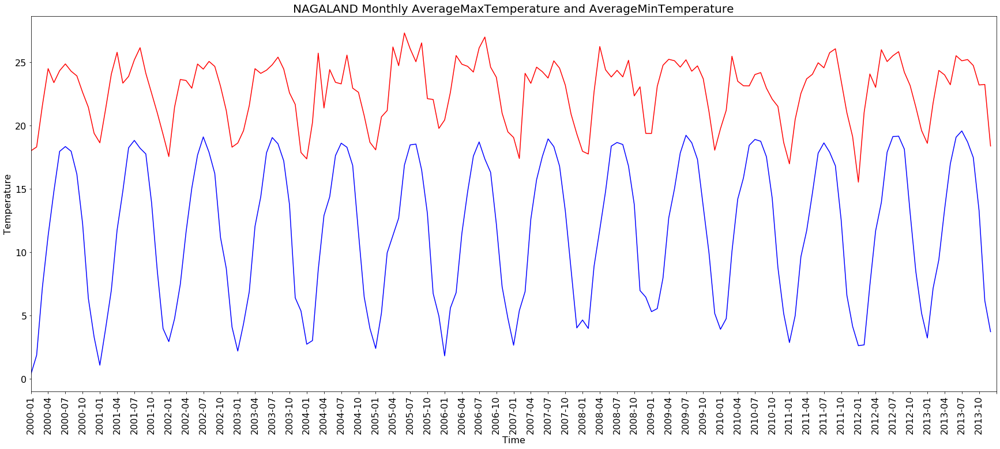

Weather  Information for NEW DELHI
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean            62.983786              18.716177              33.354960   
std            126.340850               8.248928               7.171804   
min              0.000000               4.287548              18.710194   
25%              0.254595              11.256089              27.271800   
50%              6.899357              19.619371              33.792613   
75%             58.934646              26.759532              38.676325   
max            771.098384              31.176129              45.433839   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.412981  
std                   0.185559  
min                   0.109832  
25%                   0.269325  
50%                   0.401623  
75%                   0.550134  
max                   0.8

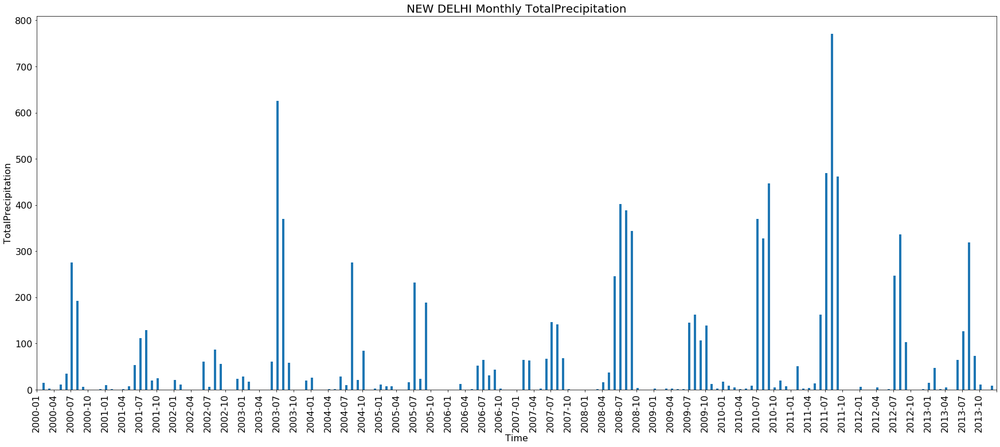

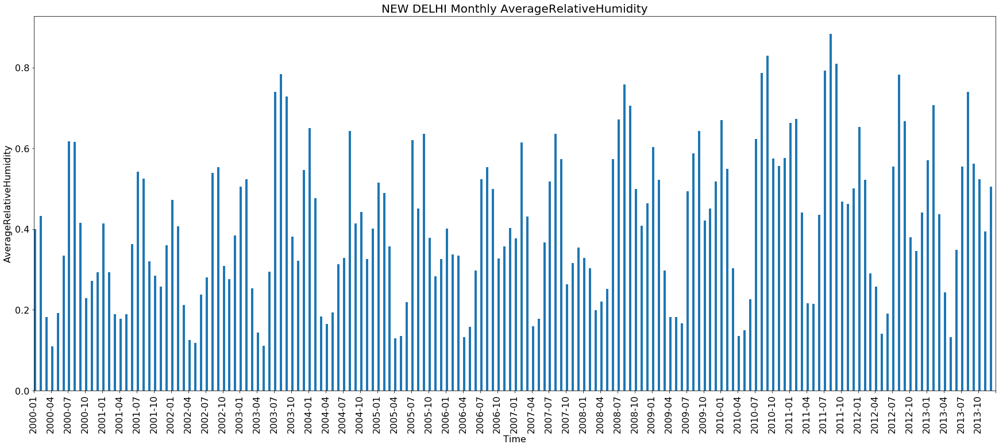

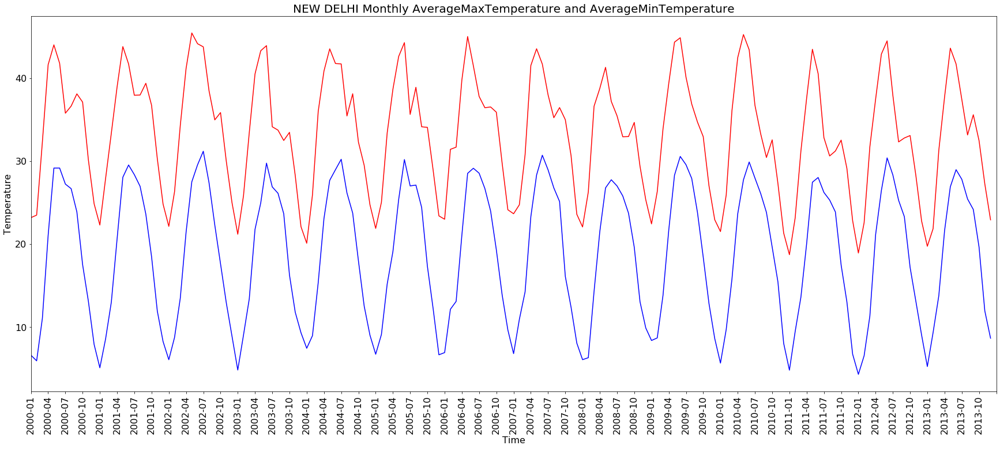

Weather  Information for ORISSA
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          5180.234360              20.509521              33.365679   
std           5532.516174               5.028453               4.674502   
min             78.719562               9.832481              25.853030   
25%            765.185322              15.603038              29.906469   
50%           2245.265744              22.142373              31.424123   
75%          10057.568465              24.587192              37.096609   
max          20566.607688              28.157267              43.503253   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.630541  
std                   0.140605  
min                   0.413095  
25%                   0.497388  
50%                   0.623161  
75%                   0.776826  
max                   0.8605

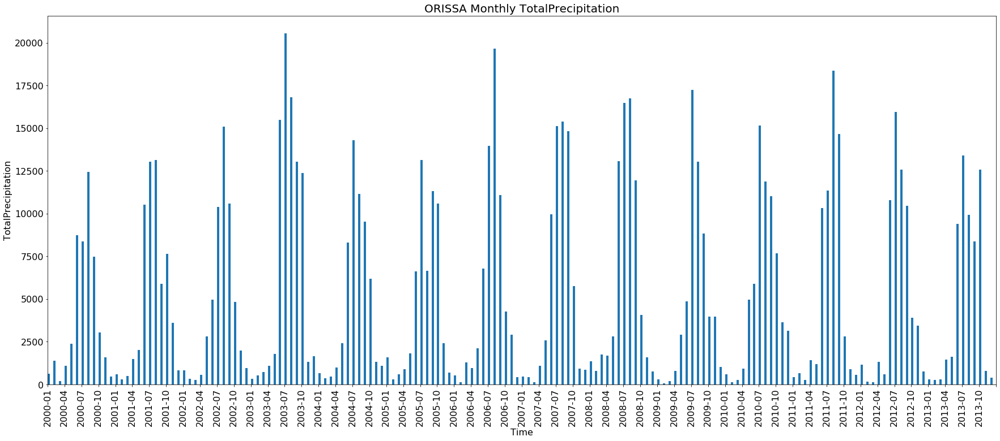

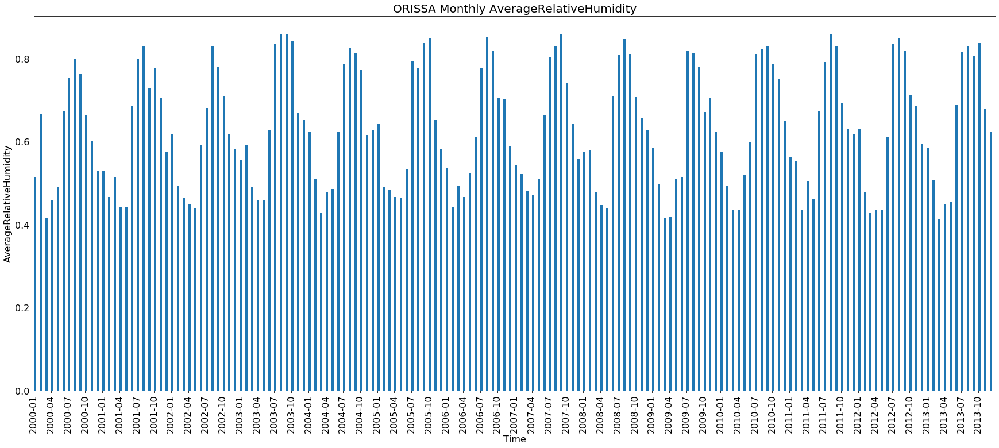

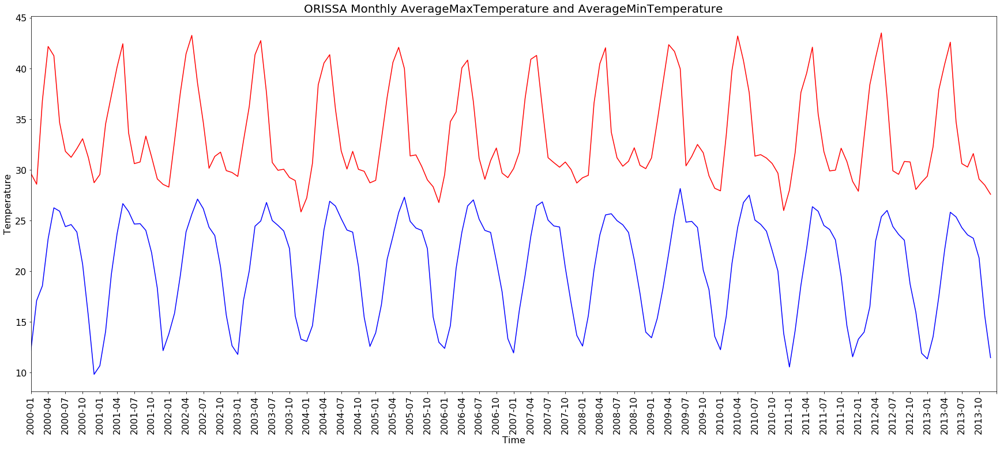

Weather  Information for PUDUCHERRY
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           132.429487              24.219822              34.873353   
std            120.512247               2.588241               3.610832   
min              0.001717              18.610468              28.052200   
25%             39.619449              21.799337              31.695185   
50%             95.614316              24.754640              35.643700   
75%            189.571900              26.217654              37.623231   
max            528.865939              28.596790              41.693887   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.647137  
std                   0.103253  
min                   0.466212  
25%                   0.563059  
50%                   0.639682  
75%                   0.733026  
max                   0.

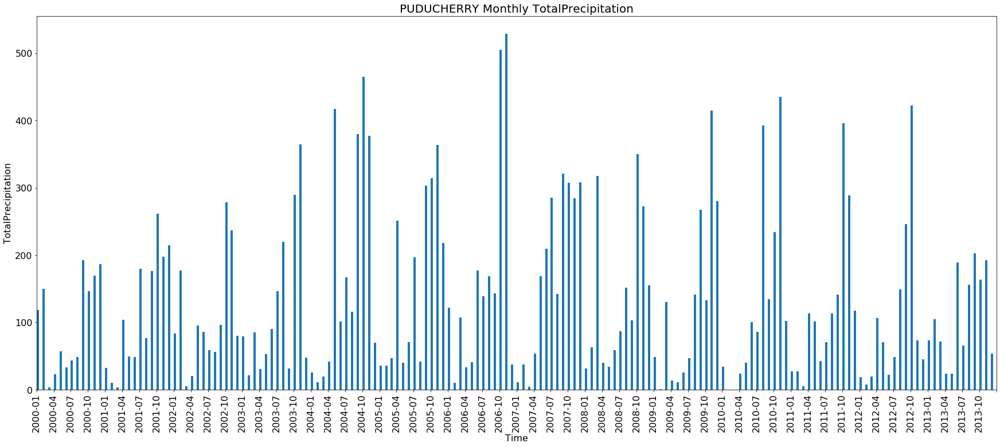

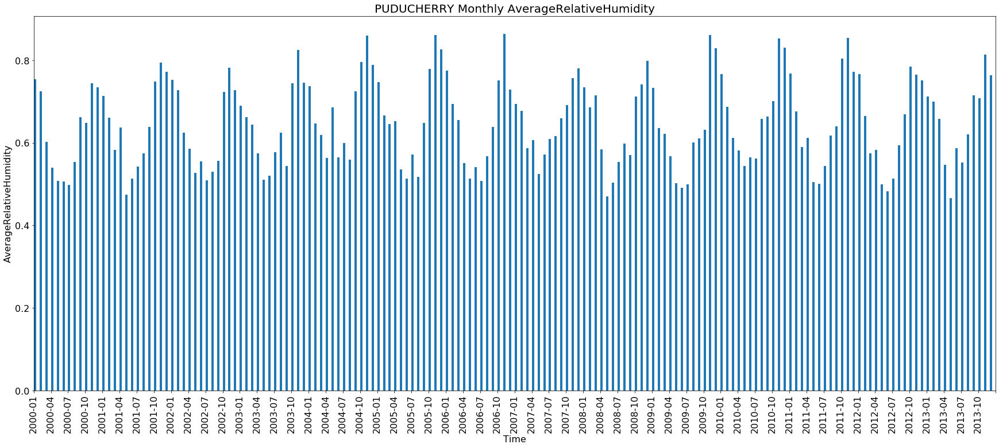

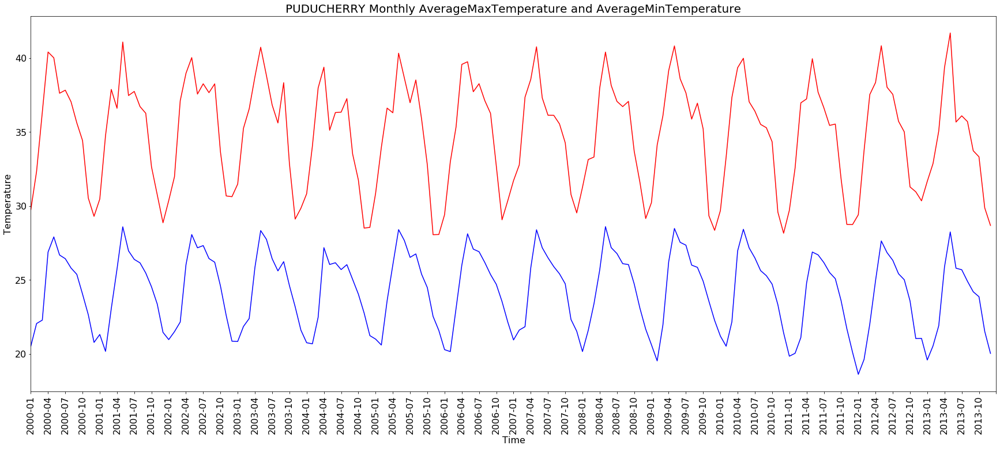

Weather  Information for PUNJAB
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1168.662960              18.319531              33.685957   
std           1047.365867               8.118856               7.469203   
min             60.678117               4.998739              18.807902   
25%            496.034381              11.118999              27.829713   
50%            946.074763              19.489462              35.031747   
75%           1410.840993              26.331483              40.074210   
max           6648.691319              30.354931              45.760131   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.450258  
std                   0.149544  
min                   0.202107  
25%                   0.314875  
50%                   0.437849  
75%                   0.561875  
max                   0.8371

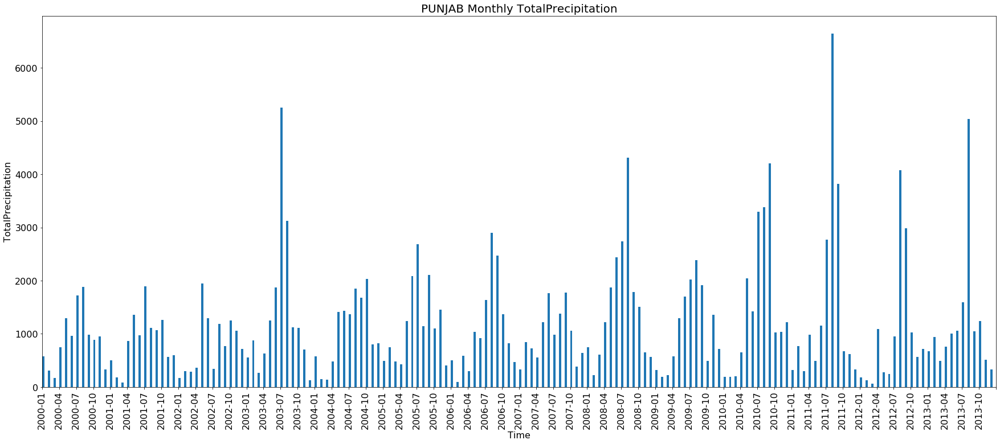

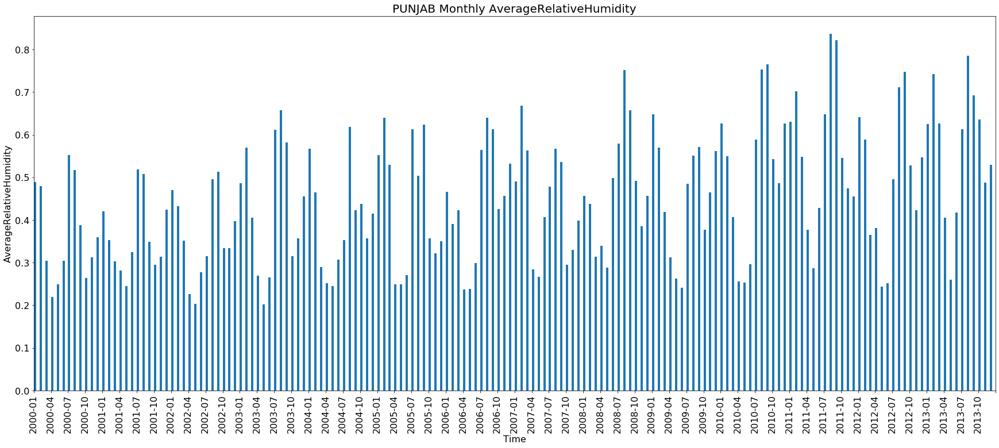

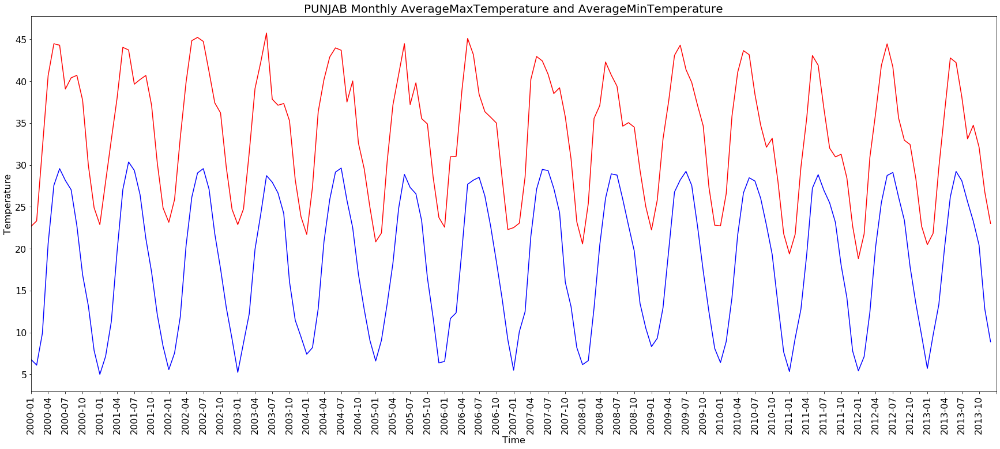

Weather  Information for RAJASTHAN
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1765.060305              19.499143              34.310900   
std           3013.328965               7.129001               5.768499   
min             15.936042               6.704557              22.597014   
25%            149.739481              13.242123              29.645238   
50%            353.963291              20.419063              34.746326   
75%           1621.402307              26.208495              38.731535   
max          18377.435738              29.717648              44.708919   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.377811  
std                   0.160238  
min                   0.141558  
25%                   0.258704  
50%                   0.342158  
75%                   0.446881  
max                   0.8

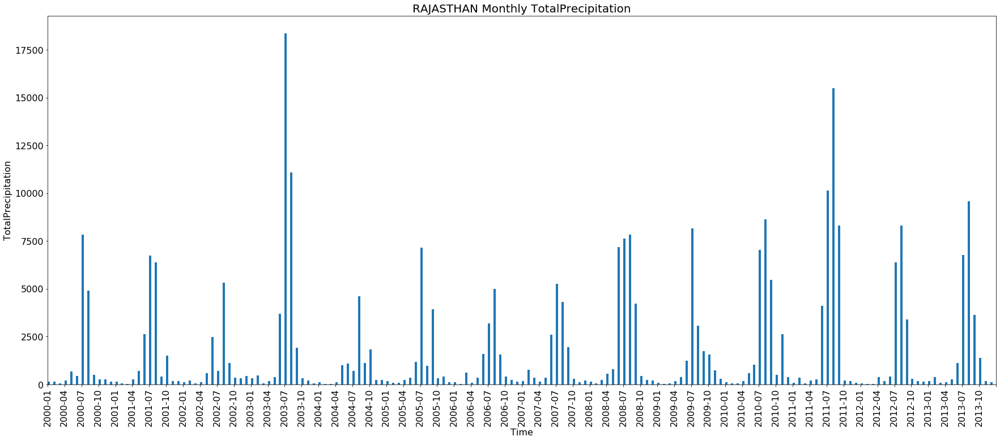

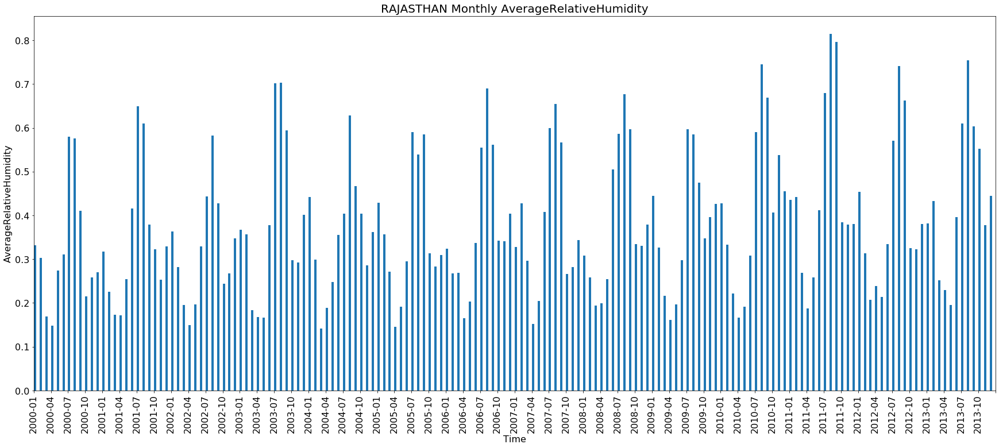

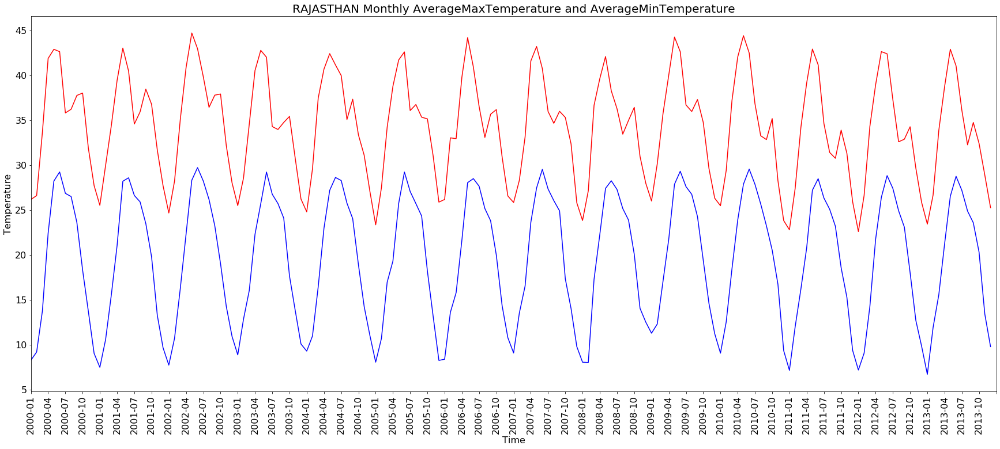

Weather  Information for SIKKIM
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           151.515695              14.573642              24.171210   
std            241.106751               5.300107               4.257456   
min              0.000000               3.255707              13.548363   
25%              3.178526               9.604396              20.796205   
50%             33.433193              16.242375              25.213999   
75%            211.476919              19.463677              27.717696   
max           1576.091847              21.425629              31.389675   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.514692  
std                   0.178469  
min                   0.160412  
25%                   0.369299  
50%                   0.507060  
75%                   0.668635  
max                   0.7975

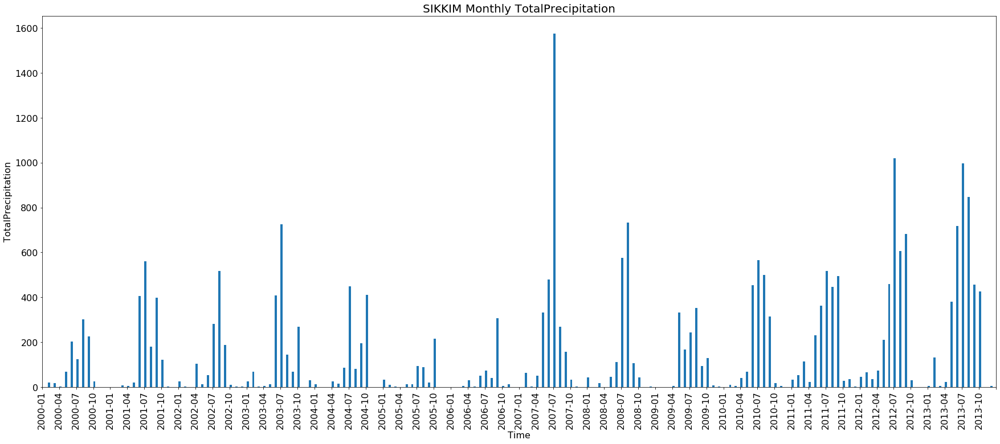

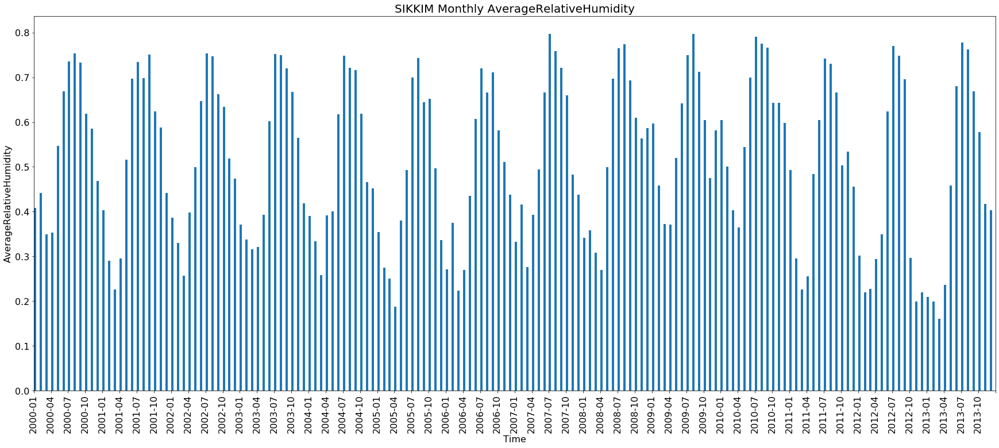

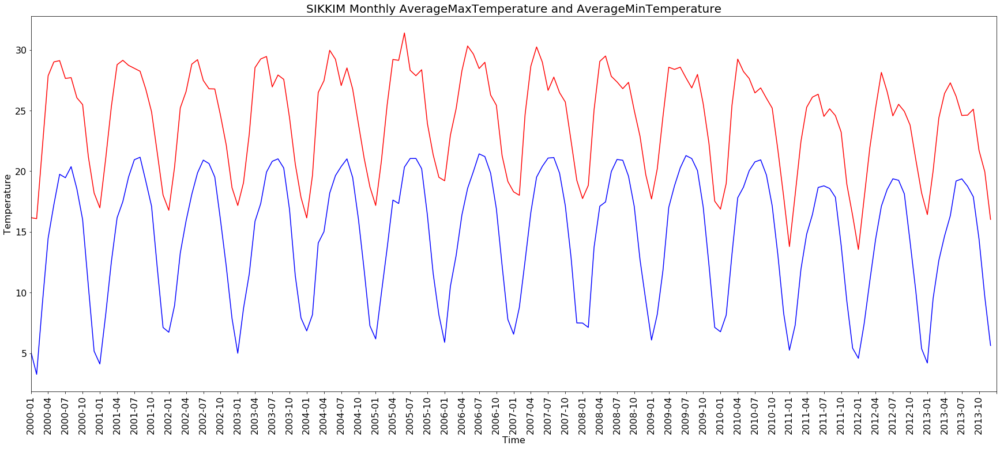

Weather  Information for TAMILNADU
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          4737.894810              22.360558              32.626297   
std           3557.300139               2.416326               2.871444   
min             75.465574              17.069862              27.108951   
25%           2370.446913              20.306615              30.505280   
50%           3935.555168              23.061171              32.679964   
75%           6434.350444              24.273769              34.594232   
max          17527.224527              26.501227              38.214269   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.677531  
std                   0.076224  
min                   0.547971  
25%                   0.618826  
50%                   0.671176  
75%                   0.730445  
max                   0.8

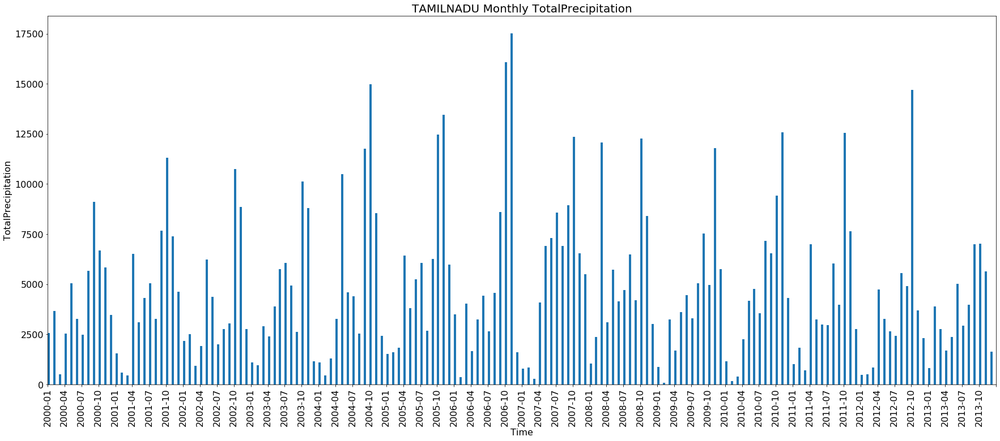

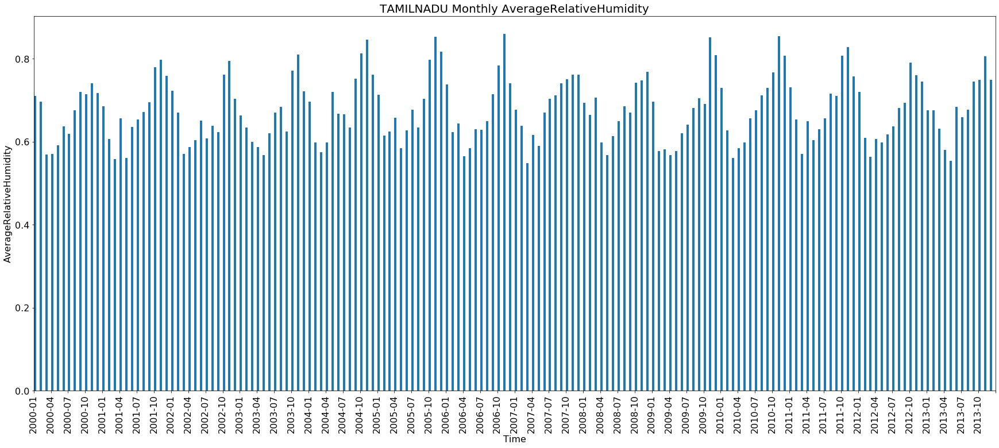

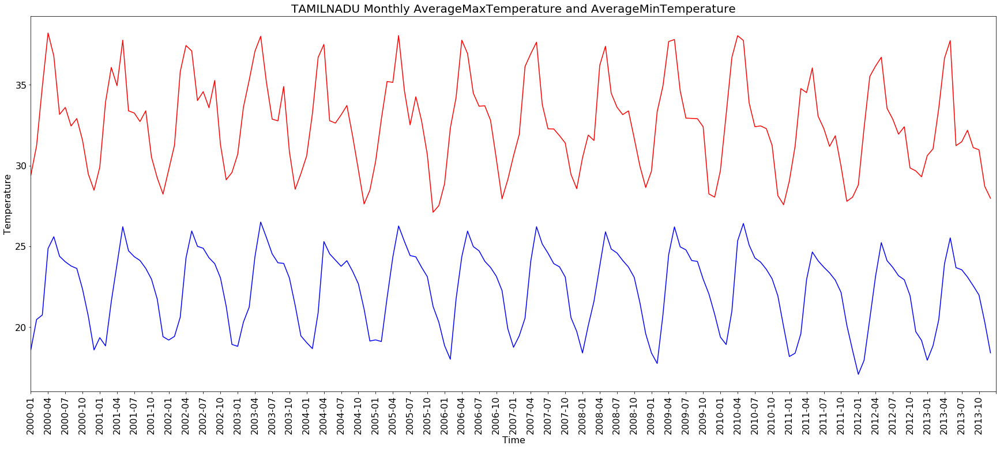

Weather  Information for TELANGANA
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           948.405742              21.075407              33.617033   
std           1167.181355               4.501144               4.511524   
min              0.004721              11.768623              27.281976   
25%             33.117330              17.153887              30.197346   
50%            244.776425              21.877088              31.634476   
75%           1641.818721              24.421201              37.452517   
max           4704.007266              29.541832              43.057045   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.533186  
std                   0.186571  
min                   0.217288  
25%                   0.362652  
50%                   0.525433  
75%                   0.699553  
max                   0.8

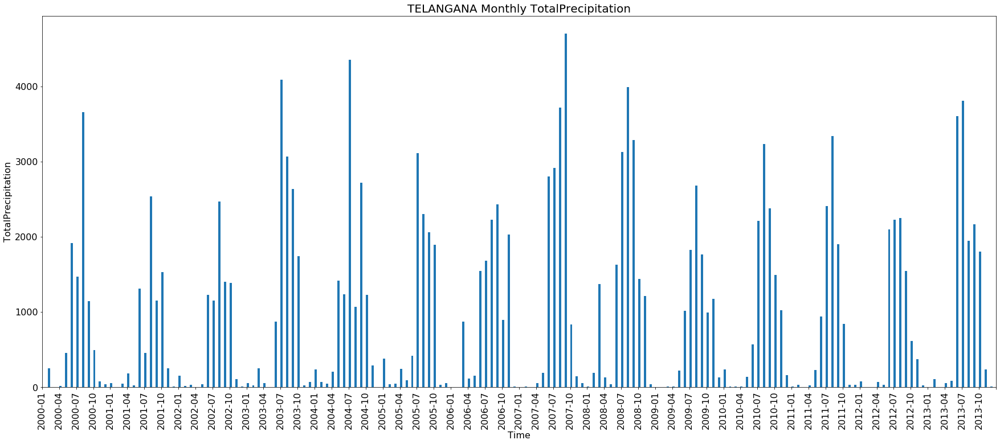

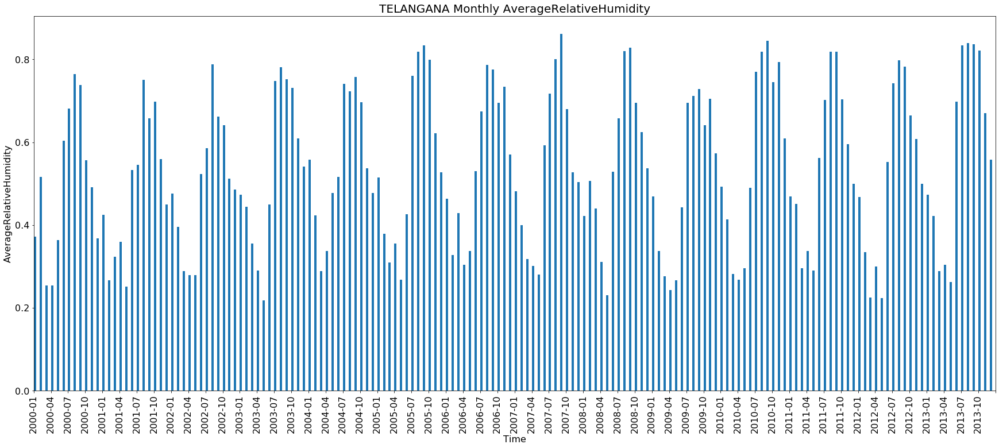

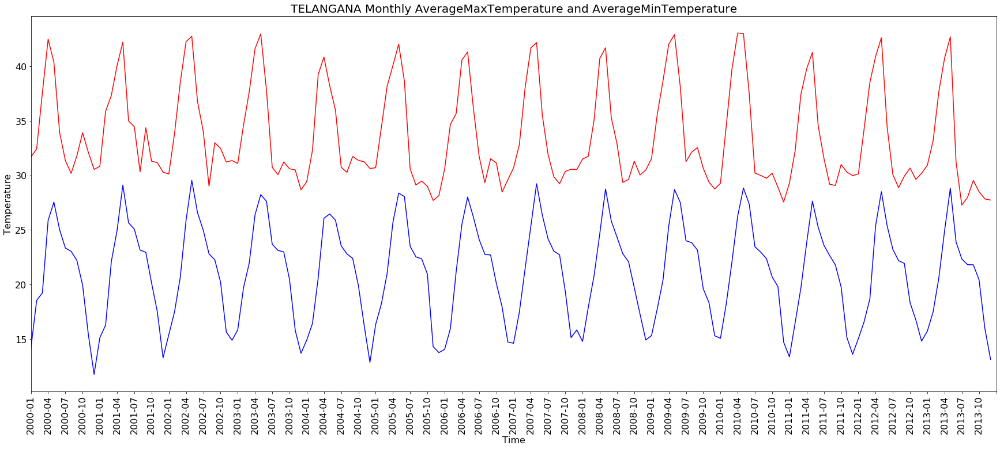

Weather  Information for TRIPURA
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean           881.567887              19.887494              30.806597   
std            870.470554               5.256202               3.388300   
min              0.000000               8.270398              25.040280   
25%             29.916500              14.741291              28.579464   
50%            690.677287              22.149750              30.543360   
75%           1556.514963              24.645349              32.600109   
max           3664.455341              25.834989              38.808711   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.745506  
std                   0.153712  
min                   0.388972  
25%                   0.614381  
50%                   0.785464  
75%                   0.884596  
max                   0.919

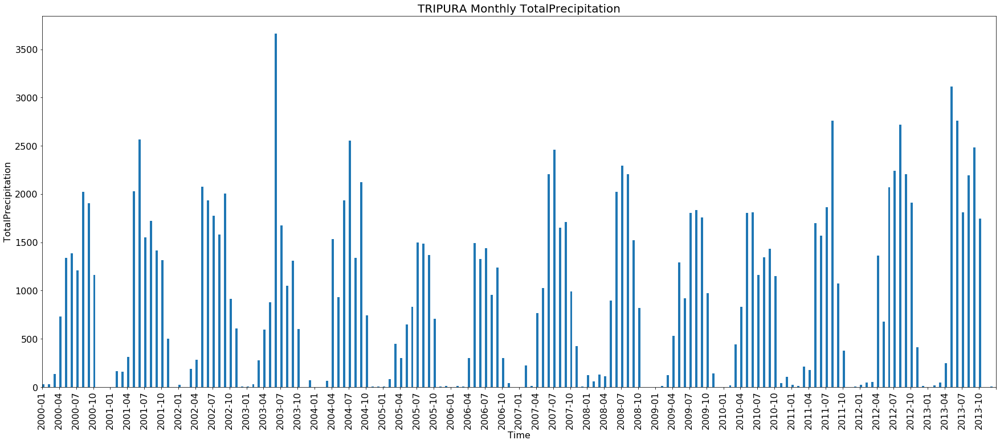

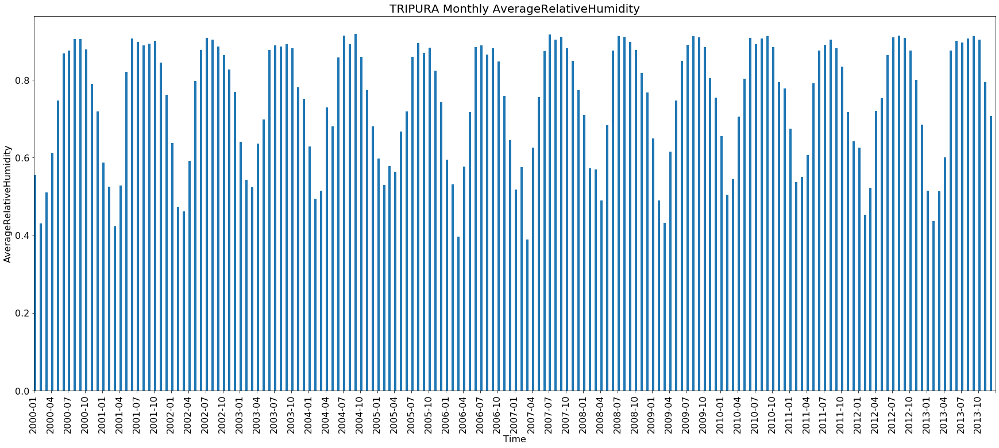

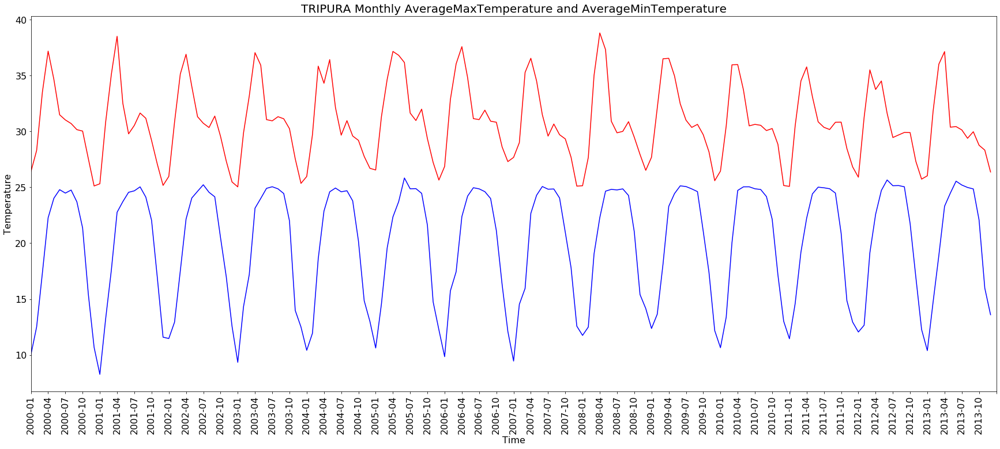

Weather  Information for UTTAR PRADESH
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          7287.079834              19.612160              33.515080   
std           8717.373132               7.422874               6.223526   
min            184.133100               6.349363              21.129415   
25%           1332.232575              12.729485              28.530707   
50%           3393.751200              20.952545              33.730339   
75%           9550.923187              26.356105              38.466930   
max          41559.260321              30.511777              44.970005   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.485850  
std                   0.182011  
min                   0.178292  
25%                   0.334534  
50%                   0.478307  
75%                   0.632018  
max                  

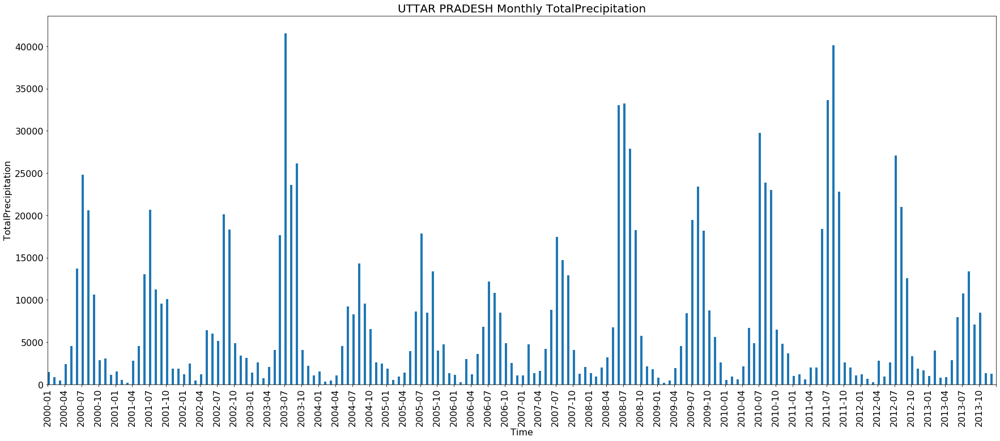

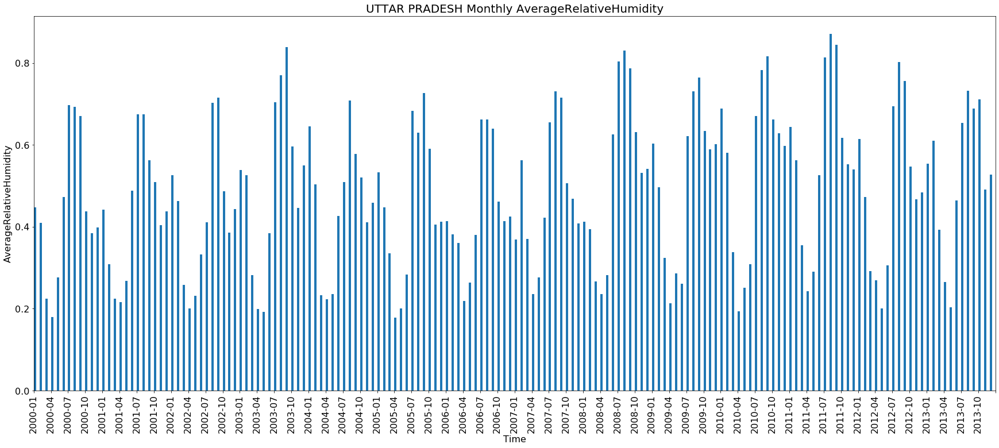

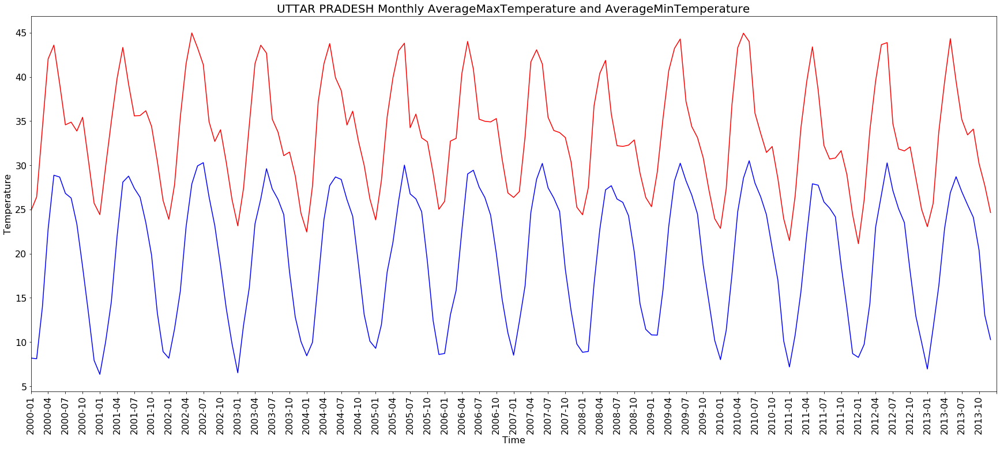

Weather  Information for UTTARAKHAND
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          1694.673412              16.146351              28.735021   
std           1781.055494               5.938218               5.223313   
min             94.467691               5.439465              18.127339   
25%            544.658390              10.287780              24.707107   
50%            968.776949              16.960058              28.672860   
75%           2383.368902              21.909942              32.536873   
max           8958.464992              24.360457              38.348976   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.484316  
std                   0.179824  
min                   0.238361  
25%                   0.333191  
50%                   0.425533  
75%                   0.640167  
max                   0

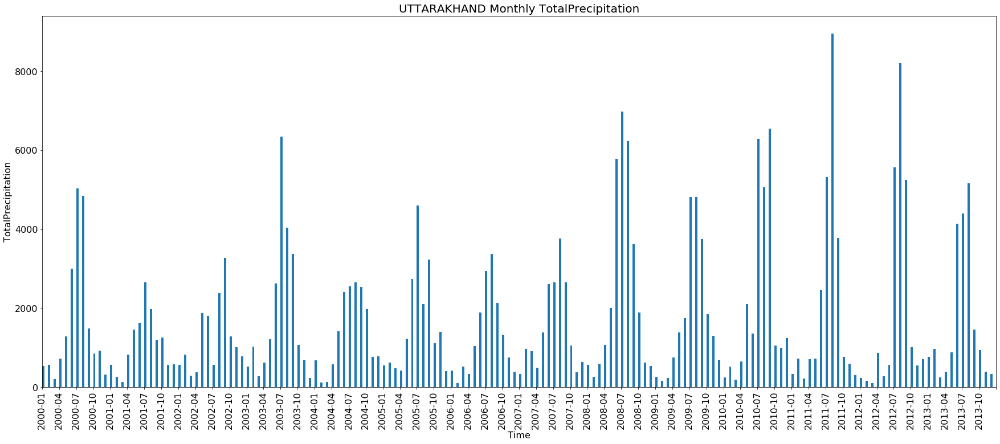

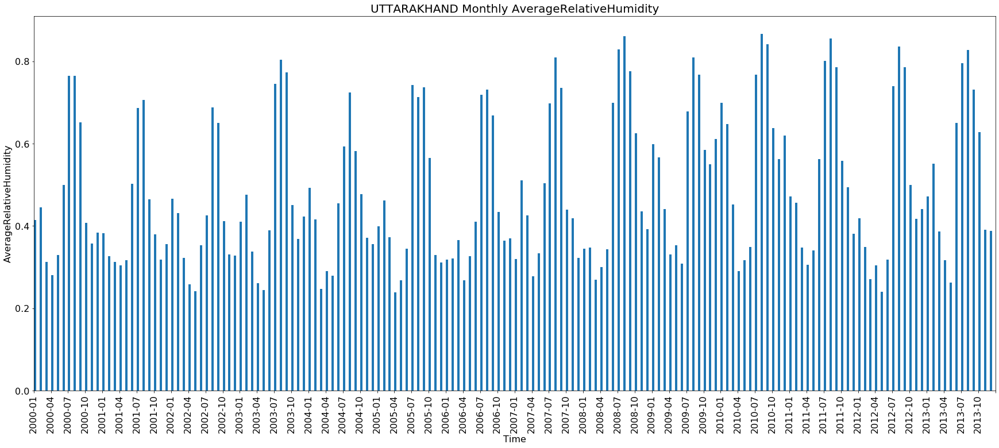

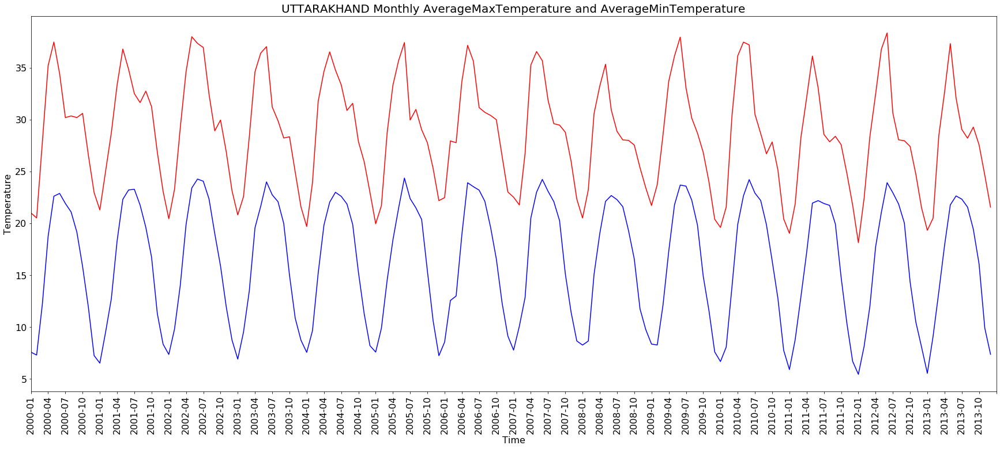

Weather  Information for WEST BENGAL
       TotalPrecipitation  AverageMinTemperature  AverageMaxTemperature  \
count          168.000000             168.000000             168.000000   
mean          3622.356057              21.415605              32.371396   
std           3439.462368               5.285954               4.227496   
min             77.664130              10.253200              24.928139   
25%            640.881953              16.514803              29.341578   
50%           2187.354375              23.347767              31.312830   
75%           6436.491816              26.135806              35.970450   
max          12444.194668              28.576602              40.994993   

       AverageRelativeHumidity  
count               168.000000  
mean                  0.639011  
std                   0.155240  
min                   0.380847  
25%                   0.510481  
50%                   0.611210  
75%                   0.797142  
max                   0

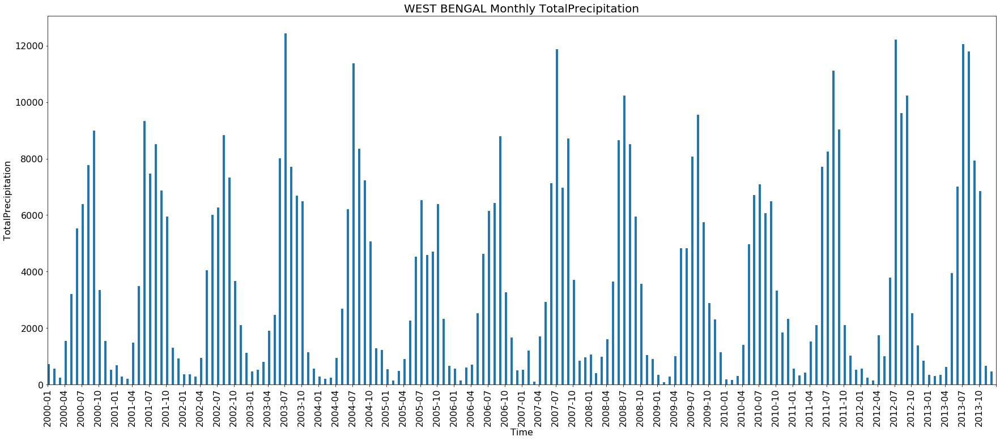

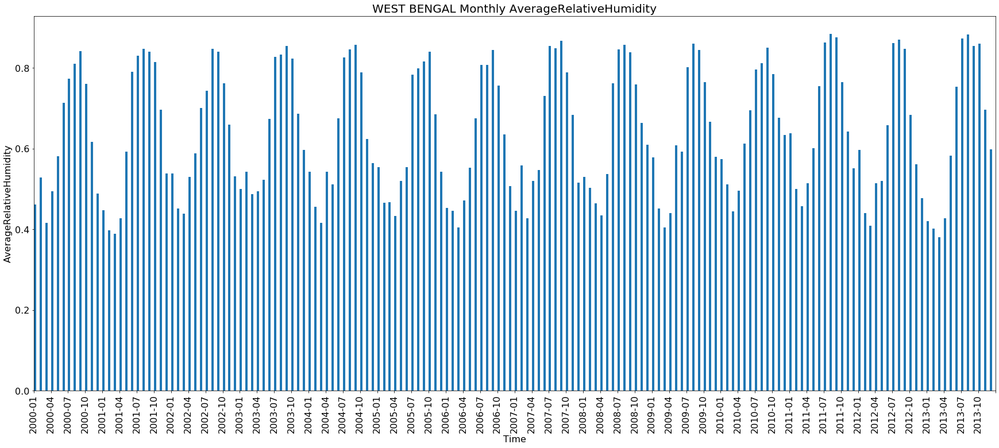

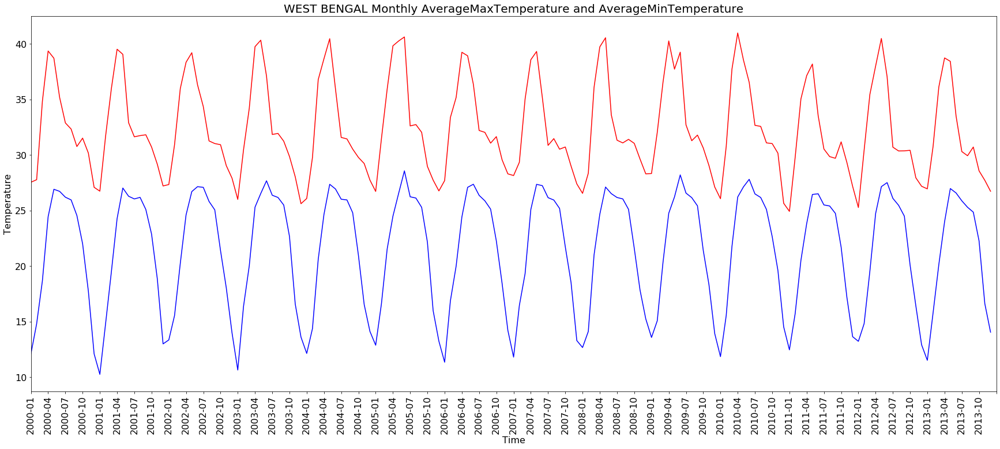

In [26]:
for state in states:
    genPlots(monthlyStateDF,state)

# Top 10 Districts Ranking

Aggregated at montly level

Aggregations used:
 - Precipitation    : sum : To get total precipitation(rainfall) recieved by the district
 - MinTemperature   : min : To get minimum temperature recorded by the district
 - MaxTemperature   : min : To get maximum temperature recorded by the district
 - RelativeHumidity : min : To get minimum relative humidity recorded by the district
 - RelativeHumidity : max : To get maximum relative humidity recorded by the district

In [27]:
#Create GroupedDataFrame and Aggregations
districtsDF = (weatherData.groupBy("Month","District_State")
               .agg(F.sum("Precipitation"),F.min("MinTemperature"),F.max("MaxTemperature"),F.min("RelativeHumidity"),F.max("RelativeHumidity"))
               .select("Month","District_State",
                    F.col("sum(Precipitation)").alias("TotalPrecipitation"),
                    F.col("min(MinTemperature)").alias("MinTemperature"),
                    F.col("max(MaxTemperature)").alias("MaxTemperature"),
                    F.col("max(RelativeHumidity)").alias("MaximumRelativeHumidity"),
                    F.col("min(RelativeHumidity)").alias("MinimumRelativeHumidity"))
              )

In [28]:
districtsDF.persist()

DataFrame[Month: string, District_State: string, TotalPrecipitation: double, MinTemperature: double, MaxTemperature: double, MaximumRelativeHumidity: double, MinimumRelativeHumidity: double]

## Hottest Districts 

In [29]:
hottestDistricts = districtsDF.select("Month","District_State","MaxTemperature")

In [30]:
@F.pandas_udf("Month string,District_State string,MaxTemperature double",F.PandasUDFType.GROUPED_MAP)
def get10MaxTemp(pdf):
    return pdf.nlargest(10,"MaxTemperature")

In [31]:
hottestDistricts = hottestDistricts.groupBy("Month").apply(get10MaxTemp)

/opt/anaconda3/lib/python3.7/site-packages/pyspark/sql/pandas/group_ops.py:76: UserWarning: It is preferred to use 'applyInPandas' over this API. This API will be deprecated in the future releases. See SPARK-28264 for more details.
  "more details.", UserWarning)


In [32]:
hottestDistricts

DataFrame[Month: string, District_State: string, MaxTemperature: double]

## Coldest Districts 

In [33]:
coldestDistricts = districtsDF.select("Month","District_State","MinTemperature")

In [34]:
@F.pandas_udf("Month string,District_State string,MinTemperature double",F.PandasUDFType.GROUPED_MAP)
def get10MinTemp(pdf):
    return pdf.nsmallest(10,"MinTemperature")

In [35]:
coldestDistricts = coldestDistricts.groupBy("Month").apply(get10MinTemp)

In [36]:
coldestDistricts

DataFrame[Month: string, District_State: string, MinTemperature: double]

## Districts with Maximum Precipitation 

In [37]:
wettestDistricts = districtsDF.select("Month","District_State","TotalPrecipitation")

In [38]:
@F.pandas_udf("Month string,District_State string,TotalPrecipitation double",F.PandasUDFType.GROUPED_MAP)
def get10MaxPreci(pdf):
    return pdf.nlargest(10,"TotalPrecipitation")

In [39]:
wettestDistricts = wettestDistricts.groupBy("Month").apply(get10MaxPreci)

In [40]:
wettestDistricts

DataFrame[Month: string, District_State: string, TotalPrecipitation: double]

## Districts with Minimum Precipitation 

In [41]:
driestDistricts = districtsDF.select("Month","District_State","TotalPrecipitation")

In [42]:
@F.pandas_udf("Month string,District_State string,TotalPrecipitation double",F.PandasUDFType.GROUPED_MAP)
def get10MinPreci(pdf):
    return pdf.nsmallest(10,"TotalPrecipitation")

In [43]:
driestDistricts = driestDistricts.groupBy("Month").apply(get10MinPreci)

In [44]:
driestDistricts

DataFrame[Month: string, District_State: string, TotalPrecipitation: double]

## Districts with Maximum Humidity

In [45]:
mostHumidDistricts = districtsDF.select("Month","District_State","MaximumRelativeHumidity")

In [46]:
@F.pandas_udf("Month string,District_State string,MaximumRelativeHumidity double",F.PandasUDFType.GROUPED_MAP)
def get10MaxHumid(pdf):
    return pdf.nlargest(10,"MaximumRelativeHumidity")

In [47]:
mostHumidDistricts = mostHumidDistricts.groupBy("Month").apply(get10MaxHumid)

In [48]:
mostHumidDistricts

DataFrame[Month: string, District_State: string, MaximumRelativeHumidity: double]

## Districts with Minimum Humidity

In [49]:
leastHumidDistricts = districtsDF.select("Month","District_State","MinimumRelativeHumidity")

In [50]:
@F.pandas_udf("Month string,District_State string,MinimumRelativeHumidity double",F.PandasUDFType.GROUPED_MAP)
def get10MinHumid(pdf):
    return pdf.nsmallest(10,"MinimumRelativeHumidity")

In [51]:
leastHumidDistricts = leastHumidDistricts.groupBy("Month").apply(get10MinHumid)

In [52]:
leastHumidDistricts

DataFrame[Month: string, District_State: string, MinimumRelativeHumidity: double]

## Storing Results to FileSystem for Tableau Vizualization

## Tableau Viz

Link: [Tableav Viz](https://public.tableau.com/views/WeatherAnalysis_16014109382880/IndianWeatherOvertheYears?:language=en&:display_count=y&publish=yes&:origin=viz_share_link)

In [53]:
%%HTML
<div class='tableauPlaceholder' id='viz1601471864533' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;We&#47;WeatherAnalysis_16014109382880&#47;IndianWeatherOvertheYears&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='WeatherAnalysis_16014109382880&#47;IndianWeatherOvertheYears' /><param name='tabs' value='yes' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;We&#47;WeatherAnalysis_16014109382880&#47;IndianWeatherOvertheYears&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1601471864533');                    var vizElement = divElement.getElementsByTagName('object')[0];                    if ( divElement.offsetWidth > 800 ) { vizElement.style.width='900px';vizElement.style.height='650px';} else if ( divElement.offsetWidth > 500 ) { vizElement.style.width='900px';vizElement.style.height='650px';} else { vizElement.style.minWidth='900px';vizElement.style.maxWidth='100%';vizElement.style.height='1050px';}                     var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>